In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
song = pd.read_csv("song_data.csv")
print(song.head(10))
print(len(song["song_id"]))
print(len(song["song_id"].unique()))
print("duplicates")
print(song[song.duplicated(['song_id'])])
print(len(song[song.duplicated(['song_id'])]))
print("=======")
print(song[song["song_id"]== "SOPFBUZ12AF729C896"])
#since there are duplicate rows we have to drop these rows to speed up our analysis

              song_id                                              title  \
0  SOQMMHC12AB0180CB8                                       Silent Night   
1  SOVFVAK12A8C1350D9                                        Tanssi vaan   
2  SOGTUKN12AB017F4F1                                  No One Could Ever   
3  SOBNYVR12A8C13558C                                      Si Vos Querés   
4  SOHSBXH12A8C13B0DF                                   Tangle Of Aspens   
5  SOZVAPQ12A8C13B63C  Symphony No. 1 G minor "Sinfonie Serieuse"/All...   
6  SOQVRHI12A6D4FB2D7                                   We Have Got Love   
7  SOEYRFT12AB018936C                                  2 Da Beat Ch'yall   
8  SOPMIYT12A6D4F851E                                            Goodbye   
9  SOJCFMH12A8C13B0C2                         Mama_ mama can't you see ?   

                                release  \
0                 Monster Ballads X-Mas   
1                           Karkuteillä   
2                                B

In [4]:
song.isnull().sum()

song_id         0
title          15
release         5
artist_name     0
year            0
dtype: int64

In [5]:
print("songs with missing titles")
print(song[song["title"].isnull()])
print("percentage of missing values :")
print((len(song[song["title"].isnull()])/len(song))*100)
print("songs with missing release")
print(song[song["release"].isnull()])
print("percentage of missing values :")
print((len(song[song["release"].isnull()])/len(song))*100)


songs with missing titles
                   song_id title                        release  \
64262   SOVICLT12A58A7C4D0   NaN               Of Flies And Men   
114672  SOAGRAA12AB018D567   NaN                   Puce de luxe   
229353  SOOAFJX12AB018A028   NaN                   Puce de luxe   
264639  SOLDTFD12AB018AFE6   NaN                   Puce de luxe   
458083  SOAUTVB12AB018AFF0   NaN                   Puce de luxe   
557125  SOMPGYE12AB018AFE0   NaN                   Puce de luxe   
578241  SOVHAZH12AB018D5B3   NaN                   Puce de luxe   
652287  SOECGBQ12AB018D582   NaN                   Puce de luxe   
697789  SOTJWHR12AB018D5A0   NaN                   Puce de luxe   
697813  SOBDDHR12AB01888A6   NaN            Grand Glam Outtakes   
725270  SOFDILP12AC960A4EF   NaN  Recupera tus Clásicos - Fobia   
795481  SOSFNKO12AB018D5BB   NaN                   Puce de luxe   
853170  SOASSAS12AB018AFCF   NaN                   Puce de luxe   
857992  SOZDBDL12AB018AFFF   NaN    

In [6]:
song=song.dropna()

In [7]:
song.isnull().sum()

song_id        0
title          0
release        0
artist_name    0
year           0
dtype: int64

In [8]:
triplet = pd.read_csv("triplets_file.csv")
print(triplet.head(10))
print(len(triplet))
len(triplet["song_id"].unique())
len(triplet[triplet.duplicated()])
#user_id can have same user_id because one user can listen to more than one song

                                    user_id             song_id  listen_count
0  b80344d063b5ccb3212f76538f3d9e43d87dca9e  SOAKIMP12A8C130995             1
1  b80344d063b5ccb3212f76538f3d9e43d87dca9e  SOBBMDR12A8C13253B             2
2  b80344d063b5ccb3212f76538f3d9e43d87dca9e  SOBXHDL12A81C204C0             1
3  b80344d063b5ccb3212f76538f3d9e43d87dca9e  SOBYHAJ12A6701BF1D             1
4  b80344d063b5ccb3212f76538f3d9e43d87dca9e  SODACBL12A8C13C273             1
5  b80344d063b5ccb3212f76538f3d9e43d87dca9e  SODDNQT12A6D4F5F7E             5
6  b80344d063b5ccb3212f76538f3d9e43d87dca9e  SODXRTY12AB0180F3B             1
7  b80344d063b5ccb3212f76538f3d9e43d87dca9e  SOFGUAY12AB017B0A8             1
8  b80344d063b5ccb3212f76538f3d9e43d87dca9e  SOFRQTD12A81C233C0             1
9  b80344d063b5ccb3212f76538f3d9e43d87dca9e  SOHQWYZ12A6D4FA701             1
2000000


0

In [9]:
triplet.isnull().sum()

user_id         0
song_id         0
listen_count    0
dtype: int64

In [10]:
data = pd.merge(triplet,song.drop_duplicates("song_id") ,on = "song_id",how="inner")
print(len(data["song_id"].unique()))
print(len(data["user_id"].unique()))
print(len(data))
print(data.head(20))


10000
76353
2000000
                                     user_id             song_id  \
0   b80344d063b5ccb3212f76538f3d9e43d87dca9e  SOAKIMP12A8C130995   
1   7c86176941718984fed11b7c0674ff04c029b480  SOAKIMP12A8C130995   
2   76235885b32c4e8c82760c340dc54f9b608d7d7e  SOAKIMP12A8C130995   
3   250c0fa2a77bc6695046e7c47882ecd85c42d748  SOAKIMP12A8C130995   
4   3f73f44560e822344b0fb7c6b463869743eb9860  SOAKIMP12A8C130995   
5   7a4b8e7d2905d13422418b4f48cc85100892e013  SOAKIMP12A8C130995   
6   b4a678fb729bfca6031a96948996ea909ca06fe5  SOAKIMP12A8C130995   
7   33280fc74b168e2667a2da5c6ab4df4cc6edfb23  SOAKIMP12A8C130995   
8   be21ec120193effd2a5e545c4bafa2e1f92e9816  SOAKIMP12A8C130995   
9   6fbb9ff93663f3c3ad206a9325d90b19278618b4  SOAKIMP12A8C130995   
10  b0520803864a0ae5f6c3cf388a690deb0ff33141  SOAKIMP12A8C130995   
11  71cf32f8871060079133fb15238ec8a38937e676  SOAKIMP12A8C130995   
12  a079310e7d04390d2f9e74a5d9aa6d84935d5a3c  SOAKIMP12A8C130995   
13  fc514c0b52aa9494e2a0e0fa

user_id         0
song_id         0
listen_count    0
title           0
release         0
artist_name     0
year            0
dtype: int64


C:\Users\Hp\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


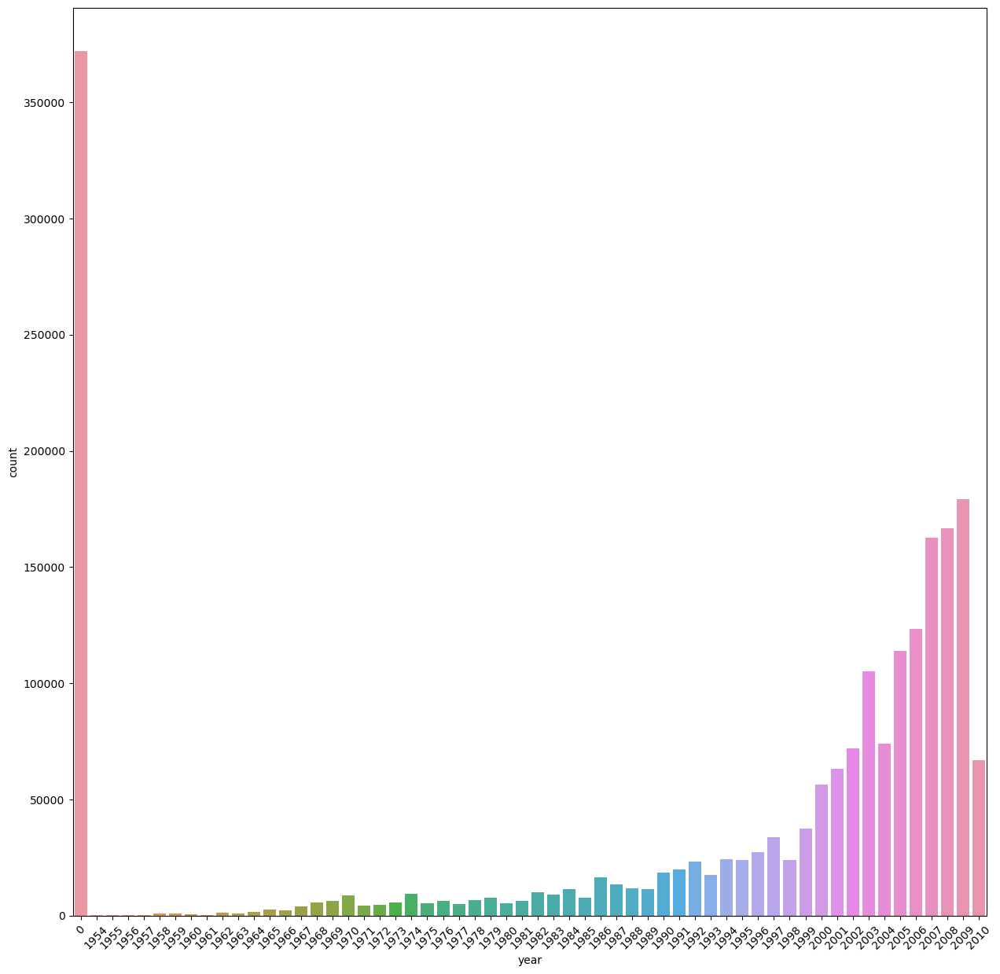

In [11]:
print(data.isnull().sum())
    
    #there are no null values

plt.figure(figsize=(15,15))
sns.countplot(data['year'])
plt.xticks(rotation=45)
plt.show()
#some music have years missing so they are filled with 0 in the csv file

In [12]:
data["listen_count"].describe()
#this shows that there is one user who is listening to the same song large number of times 

count    2.000000e+06
mean     3.045485e+00
std      6.579720e+00
min      1.000000e+00
25%      1.000000e+00
50%      1.000000e+00
75%      3.000000e+00
max      2.213000e+03
Name: listen_count, dtype: float64

In [13]:
print(data[data["listen_count"]==2213])
#d13609d62db6df876d3cc388225478618bb7b912 as listened to Gorillaz Gorillaz 

                                          user_id             song_id  \
1408721  d13609d62db6df876d3cc388225478618bb7b912  SOFCGSE12AF72A674F   

         listen_count      title   release artist_name  year  
1408721          2213  Starshine  Gorillaz    Gorillaz  2000  


In [15]:
data['listen_count'].describe()

count    2.000000e+06
mean     3.045485e+00
std      6.579720e+00
min      1.000000e+00
25%      1.000000e+00
50%      1.000000e+00
75%      3.000000e+00
max      2.213000e+03
Name: listen_count, dtype: float64

In [17]:
df

,listen_count,user_count
0,1,1138433
1,2,313043
2,3,142933
3,4,82569
4,5,93136
...,...,...
2208,2209,0
2209,2210,0
2210,2211,0
2211,2212,0


In [18]:
data.head()

,user_id,song_id,listen_count,title,release,artist_name,year
0,b80344d063b5ccb3212f76538f3d9e43d87dca9e,SOAKIMP12A8C130995,1,The Cove,Thicker Than Water,Jack Johnson,0
1,7c86176941718984fed11b7c0674ff04c029b480,SOAKIMP12A8C130995,1,The Cove,Thicker Than Water,Jack Johnson,0
2,76235885b32c4e8c82760c340dc54f9b608d7d7e,SOAKIMP12A8C130995,3,The Cove,Thicker Than Water,Jack Johnson,0
3,250c0fa2a77bc6695046e7c47882ecd85c42d748,SOAKIMP12A8C130995,1,The Cove,Thicker Than Water,Jack Johnson,0
4,3f73f44560e822344b0fb7c6b463869743eb9860,SOAKIMP12A8C130995,6,The Cove,Thicker Than Water,Jack Johnson,0


In [19]:
print("no of unique users")
print(len(data["user_id"].unique()))
print("no of unique songs")
print(len(data["song_id"].unique()))
print("no of unique artist")
print(len(data["artist_name"].unique()))
print("no of albums unique")
print(len(data["title"].unique()))


no of unique users
76353
no of unique songs
10000
no of unique artist
3375
no of albums unique
9567


In [20]:
print("No of users with listen count greater than 50 ")
print(len(data[data["listen_count"]>100]["user_id"].unique()))
print("in percent")
#len(data["user_id"].unique())
print(len(data[data["listen_count"]>100]["user_id"].unique())/len(data["user_id"].unique())*100)
      




No of users with listen count greater than 50 
638
in percent
0.835592576585072


               artist_name  count
0                      !!!    227
1     'N Sync/Phil Collins    224
2       + / - {Plus/Minus}    883
3                 10 Years    971
4                     1001    121
...                    ...    ...
3370                  moe.    728
3371            rinôçérôse    208
3372  the bird and the bee   9654
3373            themselves    192
3374               tobyMac    547

[3375 rows x 2 columns]
['Coldplay', 'Kings Of Leon', 'Florence + The Machine', 'Dwight Yoakam', 'Björk', 'The Black Keys', 'Jack Johnson', 'Justin Bieber', 'OneRepublic', 'Train', 'Alliance Ethnik', 'Muse', 'Radiohead', 'Linkin Park', 'The Killers', 'Metallica', 'Daft Punk', 'Eminem', 'Barry Tuckwell/Academy of St Martin-in-the-Fields/Sir Neville Marriner', 'Harmonia', 'John Mayer', 'Taylor Swift', "Guns N' Roses", 'Rise Against', 'Creedence Clearwater Revival', 'Gorillaz', 'Black Eyed Peas', 'Five Iron Frenzy', 'Beyoncé', '3 Doors Down', 'Nickelback', 'Lady GaGa', 'Cartola', 'Tub Ri

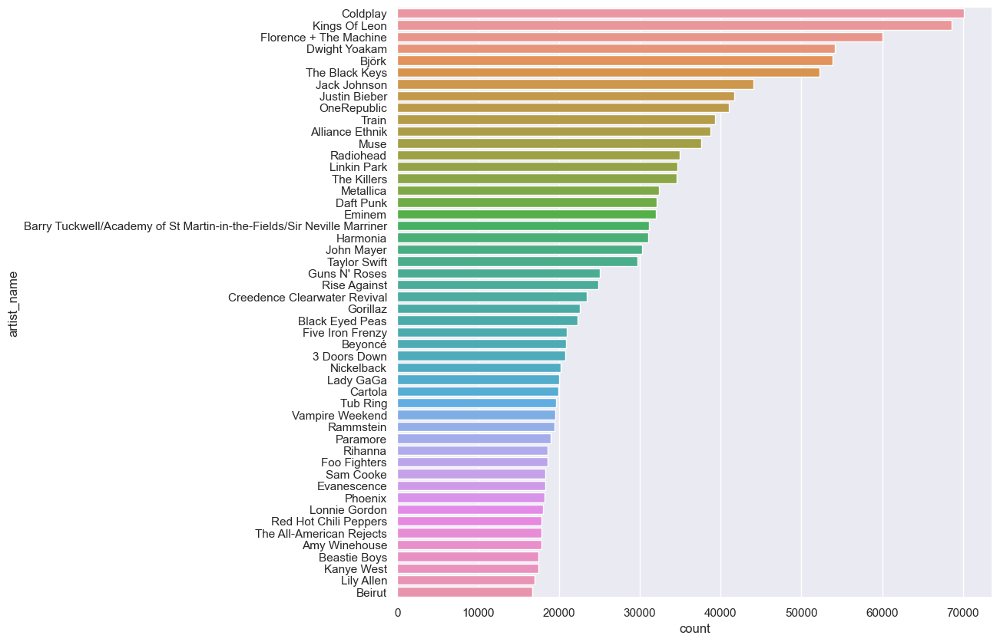

In [21]:
#Most popular artist
data
artist_df = data.groupby("artist_name")['listen_count'].sum().to_frame("count").reset_index()
print(artist_df)
artist_df['artist_name'].isnull().sum()

artist_df = artist_df.sort_values(by="count",ascending=False)
dt=artist_df.head(50)
sns.set(rc = {'figure.figsize':(10,10)})
sns.barplot(data=dt,x='count',y='artist_name')
artist_df_name=artist_df["artist_name"].head(50).values.tolist()
print(artist_df_name)

In [22]:
#Most popular song

count_songs=data.groupby("song_id")['listen_count'].sum().to_frame('count').reset_index().sort_values(by="count",ascending=False)
print(count_songs.head(50))
count_songs.values.tolist()


                 song_id  count
614   SOBONKR12A58A7A7E0  54136
317   SOAUWYT12A81C206F1  49253
7416  SOSXLTC12AF72A7F54  41418
1664  SOEGIYH12A6D4FC0E3  31153
2220  SOFRQTD12A81C233C0  31036
352   SOAXGDH12A8C13F8A1  26663
5531  SONYKOW12AB01849C9  22100
6246  SOPUCYA12A8C13A694  21019
7913  SOUFTBI12AB0183F65  19645
8252  SOVDSJC12A58A7A271  18309
5645  SOOFYTN12A6D4F9B35  18054
3074  SOHTKMO12AB01843B0  18041
617   SOBOUPA12A6D4F81F1  16674
1334  SODJWHY12A8C142CCE  15495
4448  SOLFXKT12AB017E3E0  14617
7496  SOTCMDJ12A6D4F8528  14438
2115  SOFLJQZ12A6D4FADA6  14423
7791  SOTWNDJ12A8C143984  13116
8138  SOUVTSM12AC468F6A7  12657
8029  SOUNZHU12A8AE47481  11410
7889  SOUDLVN12AAFF43658  11371
8582  SOWCKVR12A8C142411  11070
8092  SOUSMXX12AB0185C24  10832
8610  SOWEHOM12A6BD4E09E  10329
6222  SOPSOHT12A67AE0235   9524
605   SOBOAFP12A8C131F36   9449
6860  SORJICW12A8C13640D   9429
6175  SOPPROJ12AB0184E18   9265
4152  SOKLRPJ12A8C13C3FE   9048
6230  SOPTLQL12AB018D56F   8882
7103  SO

[['SOBONKR12A58A7A7E0', 54136],
 ['SOAUWYT12A81C206F1', 49253],
 ['SOSXLTC12AF72A7F54', 41418],
 ['SOEGIYH12A6D4FC0E3', 31153],
 ['SOFRQTD12A81C233C0', 31036],
 ['SOAXGDH12A8C13F8A1', 26663],
 ['SONYKOW12AB01849C9', 22100],
 ['SOPUCYA12A8C13A694', 21019],
 ['SOUFTBI12AB0183F65', 19645],
 ['SOVDSJC12A58A7A271', 18309],
 ['SOOFYTN12A6D4F9B35', 18054],
 ['SOHTKMO12AB01843B0', 18041],
 ['SOBOUPA12A6D4F81F1', 16674],
 ['SODJWHY12A8C142CCE', 15495],
 ['SOLFXKT12AB017E3E0', 14617],
 ['SOTCMDJ12A6D4F8528', 14438],
 ['SOFLJQZ12A6D4FADA6', 14423],
 ['SOTWNDJ12A8C143984', 13116],
 ['SOUVTSM12AC468F6A7', 12657],
 ['SOUNZHU12A8AE47481', 11410],
 ['SOUDLVN12AAFF43658', 11371],
 ['SOWCKVR12A8C142411', 11070],
 ['SOUSMXX12AB0185C24', 10832],
 ['SOWEHOM12A6BD4E09E', 10329],
 ['SOPSOHT12A67AE0235', 9524],
 ['SOBOAFP12A8C131F36', 9449],
 ['SORJICW12A8C13640D', 9429],
 ['SOPPROJ12AB0184E18', 9265],
 ['SOKLRPJ12A8C13C3FE', 9048],
 ['SOPTLQL12AB018D56F', 8882],
 ['SOSCIZP12AB0181D2F', 8864],
 ['SOLGLUC12AB0

                   song_id           title             release    artist_name  \
448841  SOBONKR12A58A7A7E0  You're The One  If There Was A Way  Dwight Yoakam   

        year  
448841  1990  
                   song_id title          release artist_name  year
111102  SOAUWYT12A81C206F1  Undo  Vespertine Live       Björk  2001
                   song_id    title            release    artist_name  year
865618  SOSXLTC12AF72A7F54  Revelry  Only By The Night  Kings Of Leon  2008
                   song_id                                              title  \
618654  SOEGIYH12A6D4FC0E3  Horn Concerto No. 4 in E flat K495: II. Romanc...   

                                release  \
618654  Mozart - Eine kleine Nachtmusik   

                                              artist_name  year  
618654  Barry Tuckwell/Academy of St Martin-in-the-Fie...     0  
                   song_id          title             release artist_name  \
808198  SOFRQTD12A81C233C0  Sehr kosmisch  Musik von Harmoni

<AxesSubplot:xlabel='count', ylabel='artist_name'>

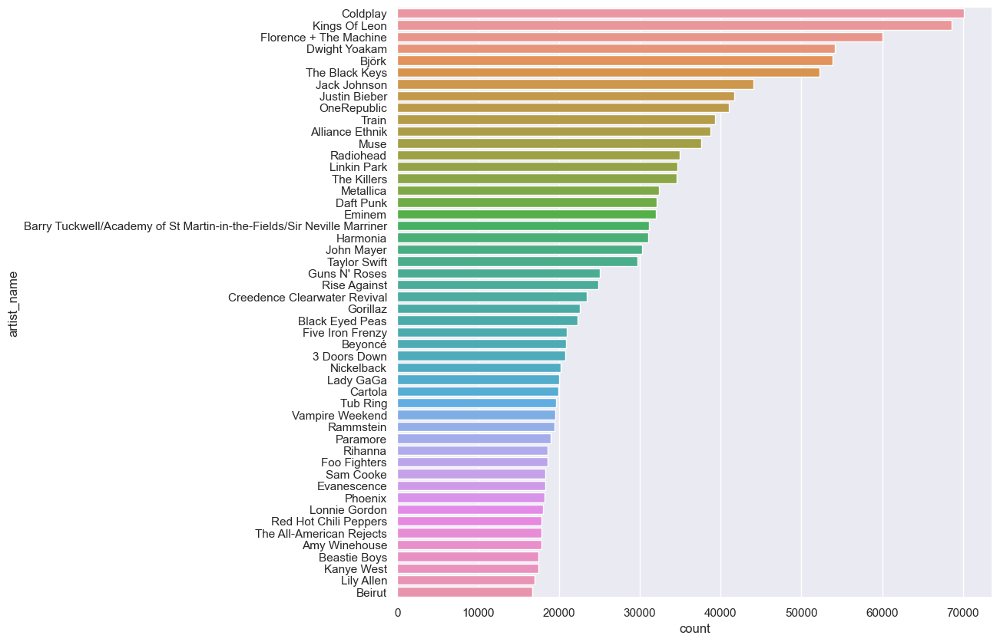

In [23]:
#Details of most popular songs
for row in count_songs.head(10).values.tolist():
    print(song[song["song_id"]==row[0]])
sns.set(rc = {'figure.figsize':(10,10)})
sns.barplot(data=dt,x='count',y='artist_name')

                                                  title  count
9496                                     You're The One  54915
8725                                               Undo  49253
6498                                            Revelry  41418
3437  Horn Concerto No. 4 in E flat K495: II. Romanc...  31153
6836                                      Sehr kosmisch  31036
1964                     Dog Days Are Over (Radio Edit)  26663
6825                                            Secrets  22100
1264                                             Canada  21019
4025                                            Invalid  19645
243                                    Ain't Misbehavin  18309
6479                                         Représente  18054
1315  Catch You Baby (Steve Pitron & Max Sanna Radio...  18041
7062                              Sincerité Et Jalousie  16674
3322                                   Hey_ Soul Sister  15495
2595                                          Fireflies

<AxesSubplot:xlabel='count', ylabel='title'>

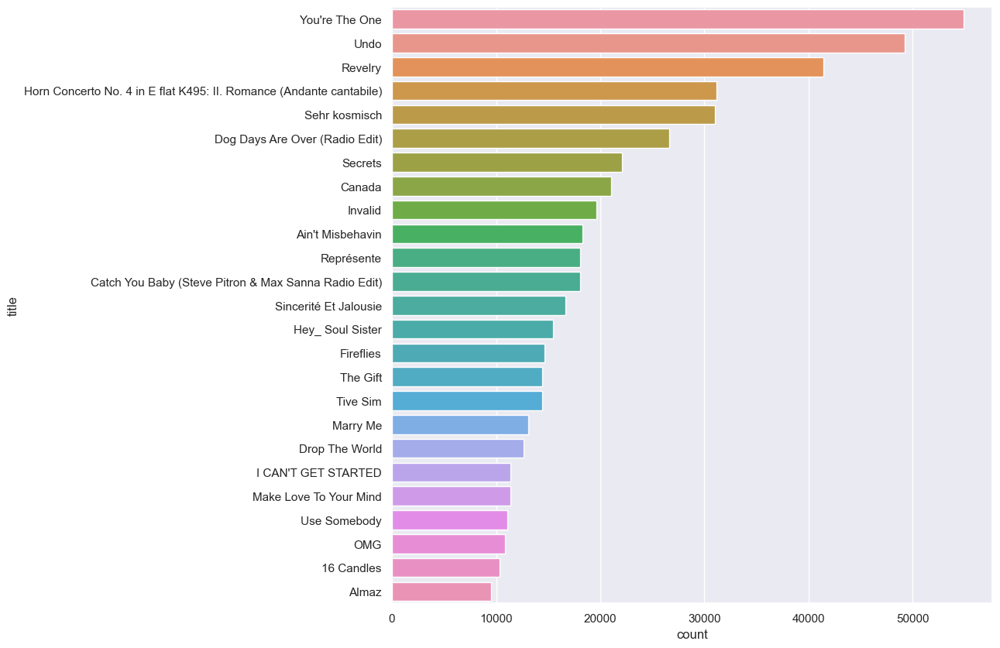

In [24]:

tit=data.groupby("title")['listen_count'].sum().to_frame('count').reset_index()
tit = tit.sort_values(by="count",ascending=False).head(25)
print(tit)
sns.barplot(x="count",y="title",data=tit)

In [25]:
tit.describe()

,count
count,25.000000
mean,20702.480000
std,12190.890199
min,9524.000000
25%,12657.000000
50%,16674.000000
75%,22100.000000
max,54915.000000


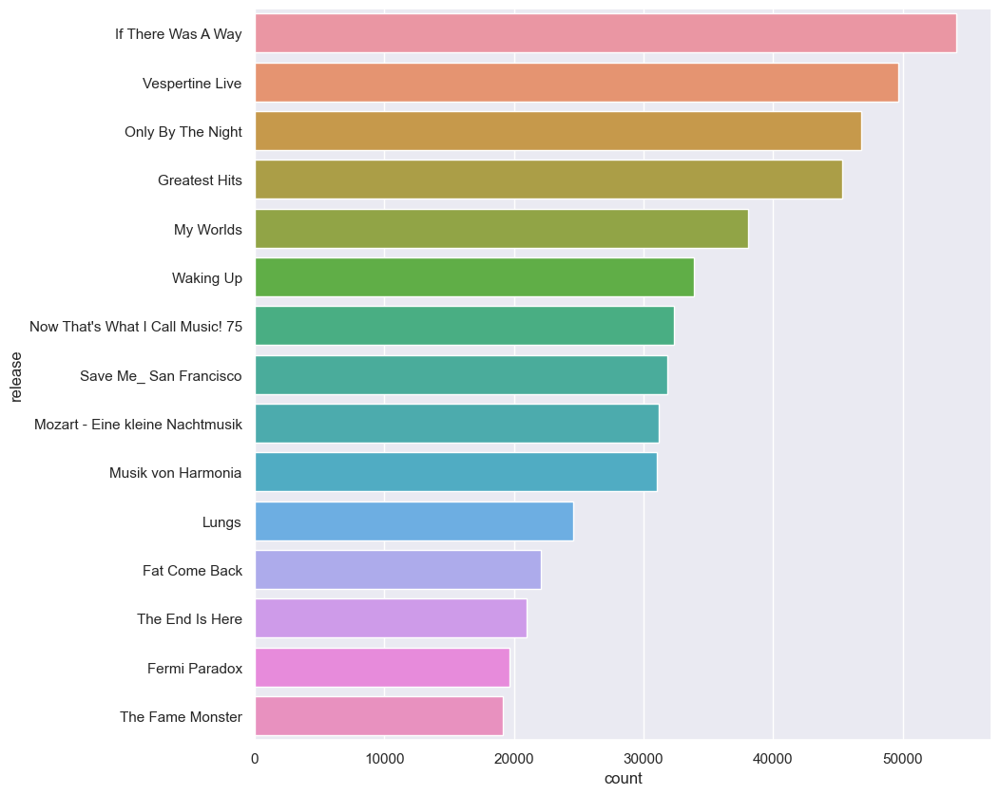

In [32]:
#most popular album

album=data.groupby("release")['listen_count'].sum().to_frame('count').reset_index()
album = album.sort_values(by="count",ascending=False).head(15)

sns.barplot(x="count",y="release",data=album)
plt.show()

In [27]:
album.describe()

,count
count,20.000000
mean,29250.600000
std,12226.081084
min,15305.000000
25%,18943.500000
50%,27803.000000
75%,34950.000000
max,54136.000000


<AxesSubplot:xlabel='count', ylabel='release'>

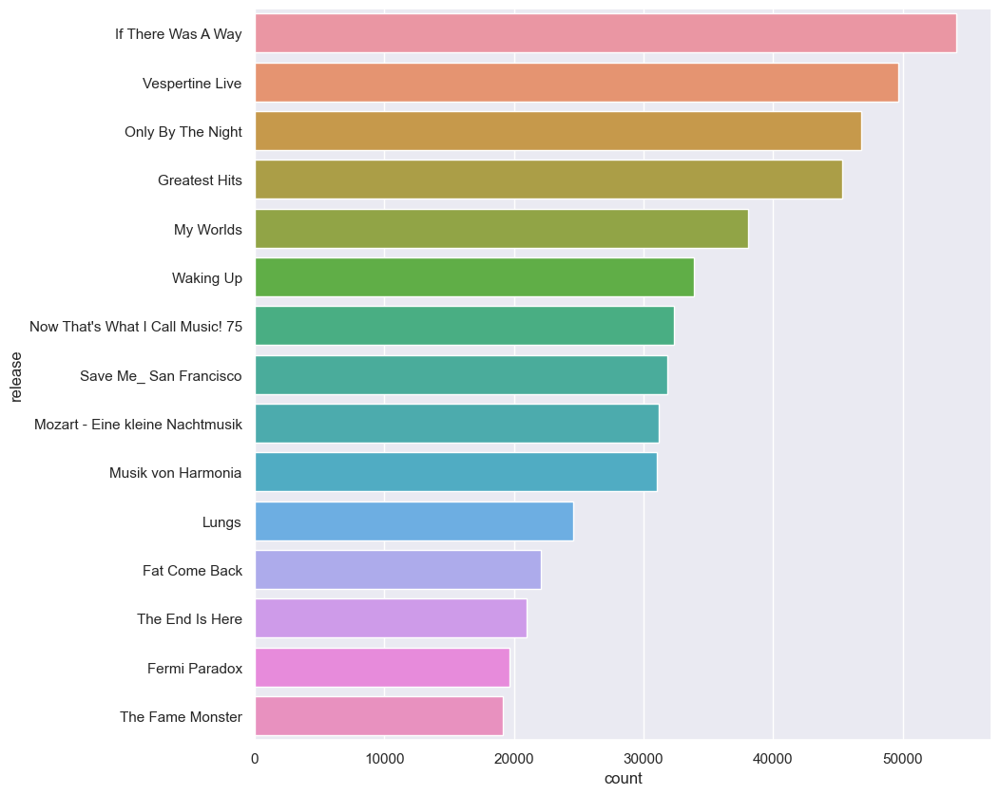

In [33]:
sns.barplot(x="count",y="release",data=album)

    year   count
56  2009  543523
55  2008  477714
54  2007  441634
53  2006  368215
52  2005  311379
50  2003  286301
51  2004  214543
48  2001  213894
49  2002  209490
57  2010  188119
    year   count
57  2010  188119


<AxesSubplot:xlabel='year', ylabel='count'>

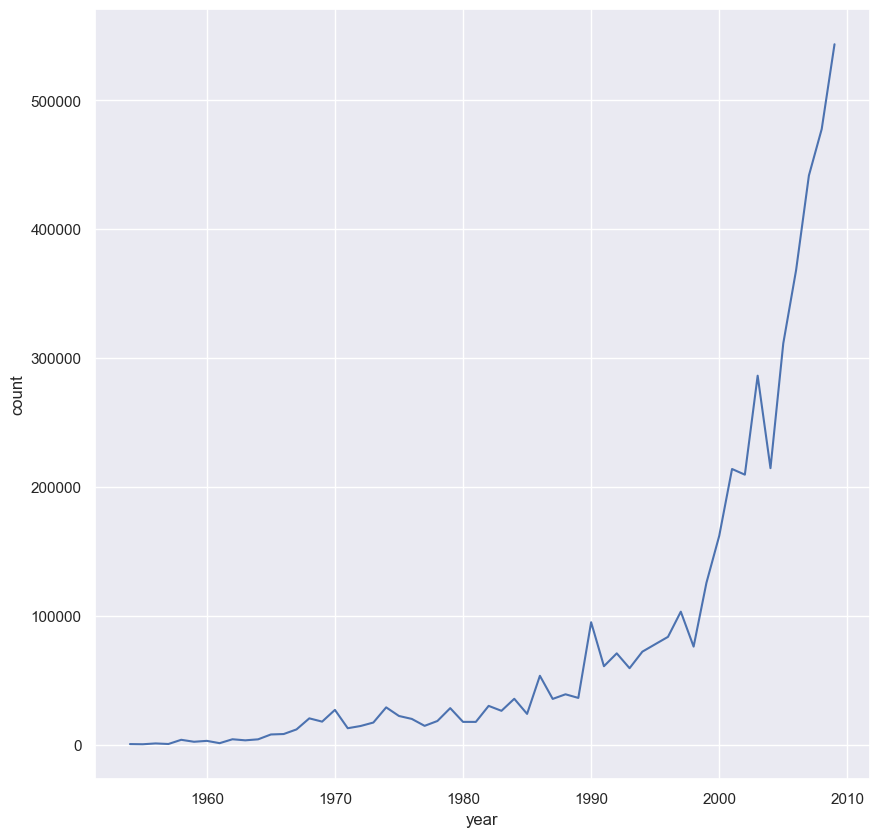

In [35]:
#Yearwise trend of listen count of songs

yearwise_trend =data.groupby(["year"])['listen_count'].sum().to_frame('count').reset_index()
yearwise_trend = yearwise_trend[1:].sort_values(by="count",ascending=False)
print(yearwise_trend.head(10))

print(yearwise_trend[yearwise_trend['year']==2010])
yearwise_trend.drop([57],axis=0,inplace=True)
sns.lineplot(x='year',y='count',data=yearwise_trend)
#drop 0 row and 2010 row because all rows having 0 year are the rows for whcih year value is missing and we have very less data pertaining to 2010
#so we drop 2010 because it will just give rise to bias

<AxesSubplot:xlabel='year', ylabel='count'>

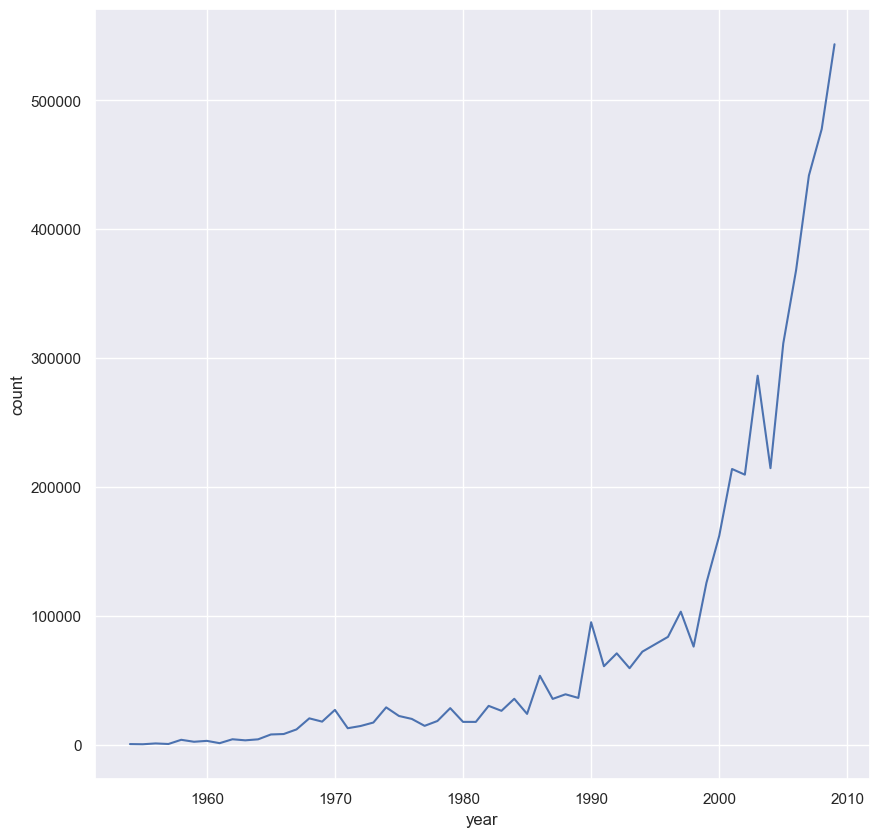

In [36]:
sns.lineplot(x='year',y='count',data=yearwise_trend)

In [43]:
import statsmodels.api as sm

In [44]:
yearwise_trend.set_index("year",inplace=True)


In [45]:
yearwise_trend.sort_values(by="count",ascending=True,inplace=True)



In [46]:
yearwise_trend.tail(20)



,count
year,
1993,59295
1991,60832
1992,70825
1994,72138
1998,76060
1995,77899
1996,83629
1990,94980
1997,103165


<Figure size 1000x1000 with 0 Axes>

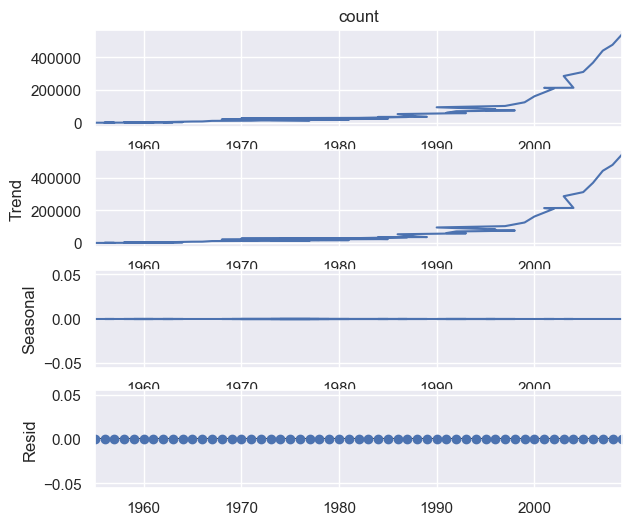

In [47]:
result = sm.tsa.seasonal_decompose(yearwise_trend["count"], model='additive',period=1)

fig = plt.figure()  
fig = result.plot()  
fig.set_size_inches(6, 5)

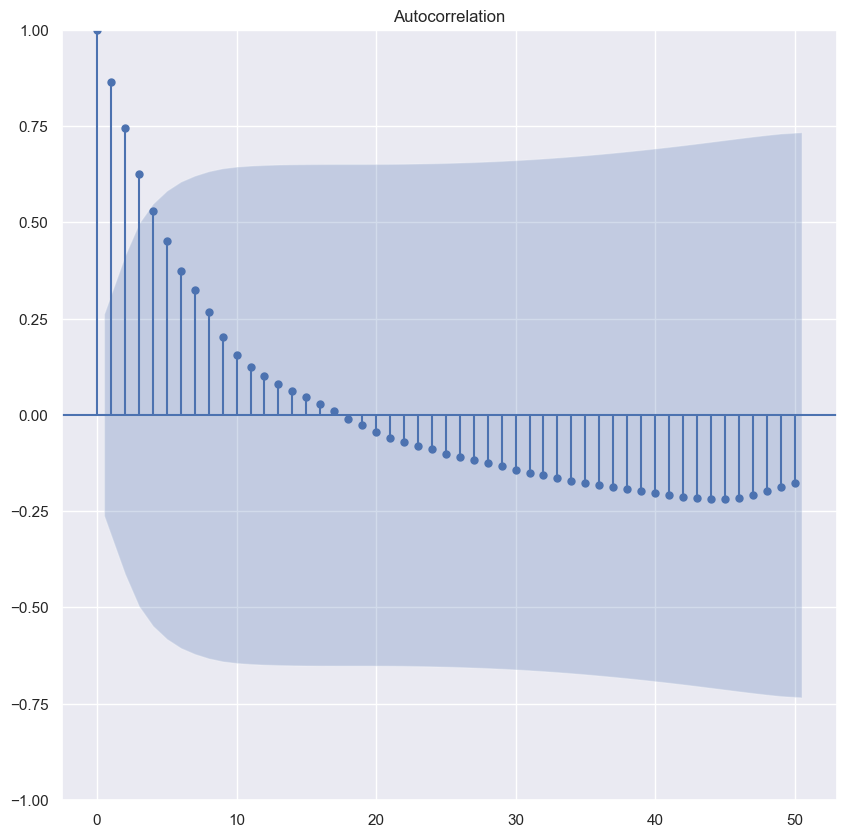

In [48]:
sm.graphics.tsa.plot_acf(yearwise_trend.values.squeeze(), lags=50)
plt.show()
# non stationary due to trend
#q=0

In [50]:
def print_adf_results(adf_result):
    print('ADF Statistic: %f' % adf_result[0])
    print('p-value: %f' % adf_result[1])
    print('Critical Values:')
    for key, value in adf_result[4].items():
        print('\t%s: %.3f' % (key, value))

from statsmodels.tsa.stattools import adfuller
adf_result = adfuller(yearwise_trend)

In [51]:
print_adf_results(adf_result)
# not stationary needs to be converted to stationary.The reason for it to be non stationary is the trend

ADF Statistic: 5.163945
p-value: 1.000000
Critical Values:
	1%: -3.566
	5%: -2.920
	10%: -2.598


In [52]:
# to remove trend
import numpy as np
transformed_df = yearwise_trend["count"].apply(lambda x : x ** 0.02)
tranformed_df=yearwise_trend.diff().dropna()
trans_adf = adfuller(tranformed_df)
print_adf_results(trans_adf)


ADF Statistic: 6.573763
p-value: 1.000000
Critical Values:
	1%: -3.593
	5%: -2.932
	10%: -2.604


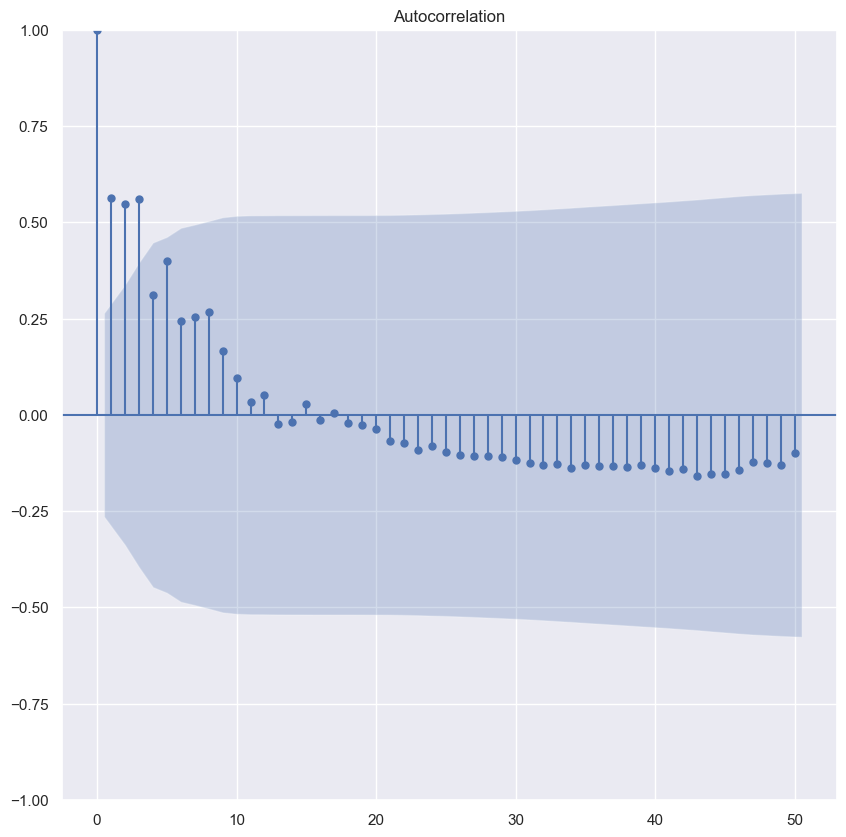

In [53]:

sm.graphics.tsa.plot_acf(tranformed_df, lags=50)
plt.show()
# non stationary due to trend
#q=3

In [55]:
!pip install pmdarima

In [56]:
from pmdarima.arima import auto_arima

In [57]:
len(yearwise_trend)

56

In [58]:
dt=yearwise_trend.reset_index()["count"]

In [59]:
train=dt[0:57]

In [60]:
#test=dt[55:]

In [61]:
len(train)

56

In [62]:
import pmdarima as pm
import pandas as pd

model_1 = pm.auto_arima(train, start_p=1, start_q=1,
                      test='adf',
                      max_p=4, max_q=4,
                      m=1,
                      d=None,
                      seasonal=False,
                      start_P=0,
                      D=0,
                      trace=True,
                      error_action='ignore',
                      suppress_warnings=True,
                      stepwise=True)

print(model_1.summary())

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=1181.797, Time=0.06 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=1202.087, Time=0.00 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=1188.864, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=1186.253, Time=0.02 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=1200.438, Time=0.00 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=1169.641, Time=0.05 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=1169.836, Time=0.02 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=1169.552, Time=0.11 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=1171.481, Time=0.02 sec
 ARIMA(4,2,1)(0,0,0)[0] intercept   : AIC=1169.356, Time=0.21 sec
 ARIMA(4,2,0)(0,0,0)[0] intercept   : AIC=1169.153, Time=0.07 sec
 ARIMA(4,2,0)(0,0,0)[0]             : AIC=1170.492, Time=0.06 sec

Best model:  ARIMA(4,2,0)(0,0,0)[0] intercept
Total fit time: 0.716 seconds
                               SARIMAX Results                                
Dep. Vari

In [63]:
yearwise_trend

,count
year,
1955,282
1954,406
1957,474
1956,909
1961,1118
1959,2210
1960,2908
1963,3327
1958,3733


In [64]:
pred=model_1.predict(1).reset_index()

In [65]:
predict=pred[0]
predict=predict.tolist()

In [68]:
index =pd.Index(["2010","2011","2012","2013","2014","2015","2016","2017","2018","2019","2020","2021","2022","2023","2024"])

dt=model_1.predict(15).tolist()

In [69]:
dic={"year":index,'listen_count':dt}

In [70]:
forecat_10=pd.DataFrame(dic)

In [71]:
forecat_10.head(10)

,year,listen_count
0,2010,6.051503e+05
1,2011,6.517776e+05
2,2012,7.230190e+05
3,2013,7.814937e+05
4,2014,8.383506e+05
5,2015,9.099236e+05
6,2016,9.691804e+05
7,2017,1.034339e+06
8,2018,1.105608e+06
9,2019,1.168523e+06


<AxesSubplot:xlabel='year', ylabel='listen_count'>

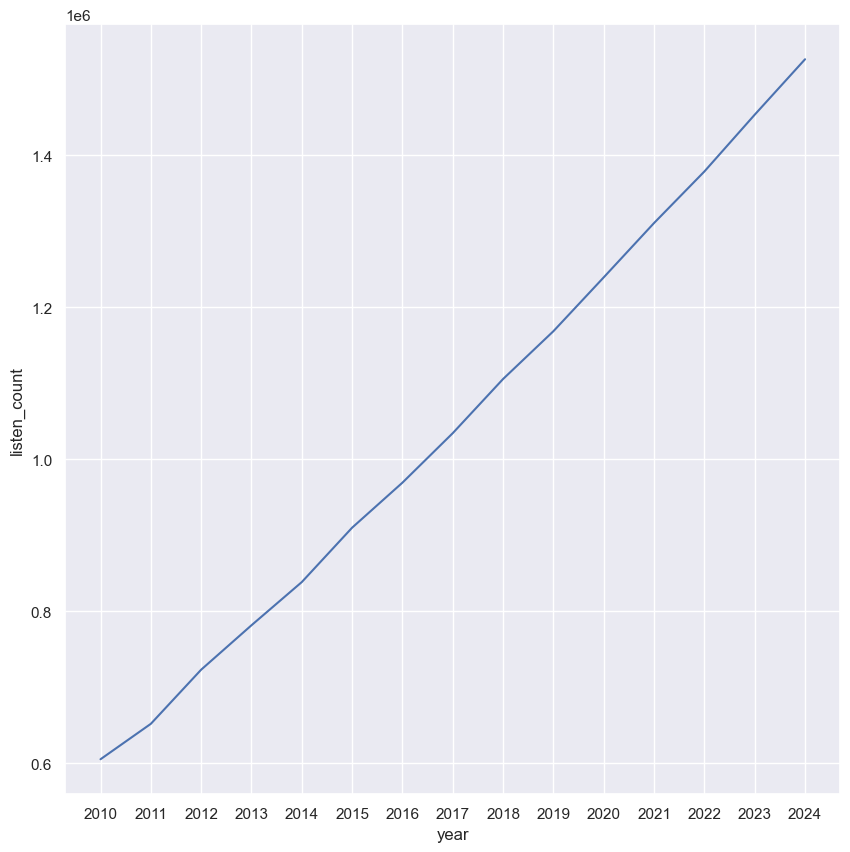

In [72]:
sns.set(rc = {'figure.figsize':(10,10)})
sns.lineplot(data=forecat_10,x='year',y='listen_count')

In [73]:
#correlation matrix

data.head()

,user_id,song_id,listen_count,title,release,artist_name,year
0,b80344d063b5ccb3212f76538f3d9e43d87dca9e,SOAKIMP12A8C130995,1,The Cove,Thicker Than Water,Jack Johnson,0
1,7c86176941718984fed11b7c0674ff04c029b480,SOAKIMP12A8C130995,1,The Cove,Thicker Than Water,Jack Johnson,0
2,76235885b32c4e8c82760c340dc54f9b608d7d7e,SOAKIMP12A8C130995,3,The Cove,Thicker Than Water,Jack Johnson,0
3,250c0fa2a77bc6695046e7c47882ecd85c42d748,SOAKIMP12A8C130995,1,The Cove,Thicker Than Water,Jack Johnson,0
4,3f73f44560e822344b0fb7c6b463869743eb9860,SOAKIMP12A8C130995,6,The Cove,Thicker Than Water,Jack Johnson,0


               artist_name  count
0                      !!!    227
1     'N Sync/Phil Collins    224
2       + / - {Plus/Minus}    883
3                 10 Years    971
4                     1001    121
...                    ...    ...
3370                  moe.    728
3371            rinôçérôse    208
3372  the bird and the bee   9654
3373            themselves    192
3374               tobyMac    547

[3375 rows x 2 columns]
['Coldplay', 'Kings Of Leon', 'Florence + The Machine', 'Dwight Yoakam', 'Björk', 'The Black Keys', 'Jack Johnson', 'Justin Bieber', 'OneRepublic', 'Train', 'Alliance Ethnik', 'Muse', 'Radiohead', 'Linkin Park', 'The Killers', 'Metallica', 'Daft Punk', 'Eminem', 'Barry Tuckwell/Academy of St Martin-in-the-Fields/Sir Neville Marriner', 'Harmonia', 'John Mayer', 'Taylor Swift', "Guns N' Roses", 'Rise Against', 'Creedence Clearwater Revival', 'Gorillaz', 'Black Eyed Peas', 'Five Iron Frenzy', 'Beyoncé', '3 Doors Down', 'Nickelback', 'Lady GaGa', 'Cartola', 'Tub Ri

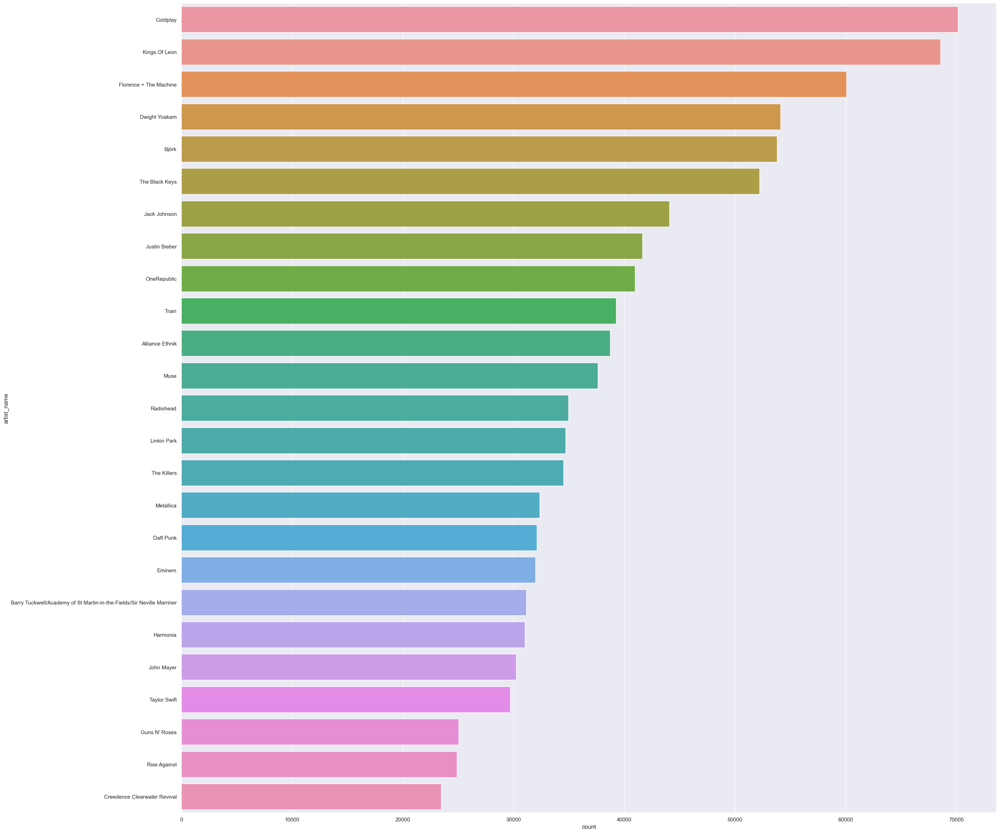

In [86]:
artist_df = data.groupby("artist_name")['listen_count'].sum().to_frame("count").reset_index()
print(artist_df)
artist_df['artist_name'].isnull().sum()

artist_df = artist_df.sort_values(by="count",ascending=False)
dt=artist_df.head(25)
sns.set(rc = {'figure.figsize':(30,30)})
sns.barplot(data=dt,x='count',y='artist_name')
artist_df_name=artist_df["artist_name"].head(100).values.tolist()
print(artist_df_name)

In [87]:
data.groupby("year")["song_id"].count()

year
0       372122
1954       144
1955       148
1956       403
1957       225
1958       765
1959       941
1960       680
1961       288
1962      1160
1963       942
1964      1530
1965      2714
1966      2353
1967      3889
1968      5646
1969      6479
1970      8539
1971      4152
1972      4616
1973      5594
1974      9392
1975      5459
1976      6179
1977      4963
1978      6570
1979      7763
1980      5340
1981      6429
1982     10024
1983      9073
1984     11570
1985      7836
1986     16549
1987     13549
1988     11727
1989     11354
1990     18581
1991     19818
1992     23248
1993     17473
1994     24166
1995     23996
1996     27260
1997     33602
1998     23845
1999     37529
2000     56383
2001     63326
2002     71825
2003    105226
2004     73845
2005    113996
2006    123331
2007    162573
2008    166788
2009    179168
2010     66914
Name: song_id, dtype: int64

   year  count
0  2002    242
1  2003   1716
2  2006   1923
3  2008   4074


<Figure size 1000x1000 with 0 Axes>

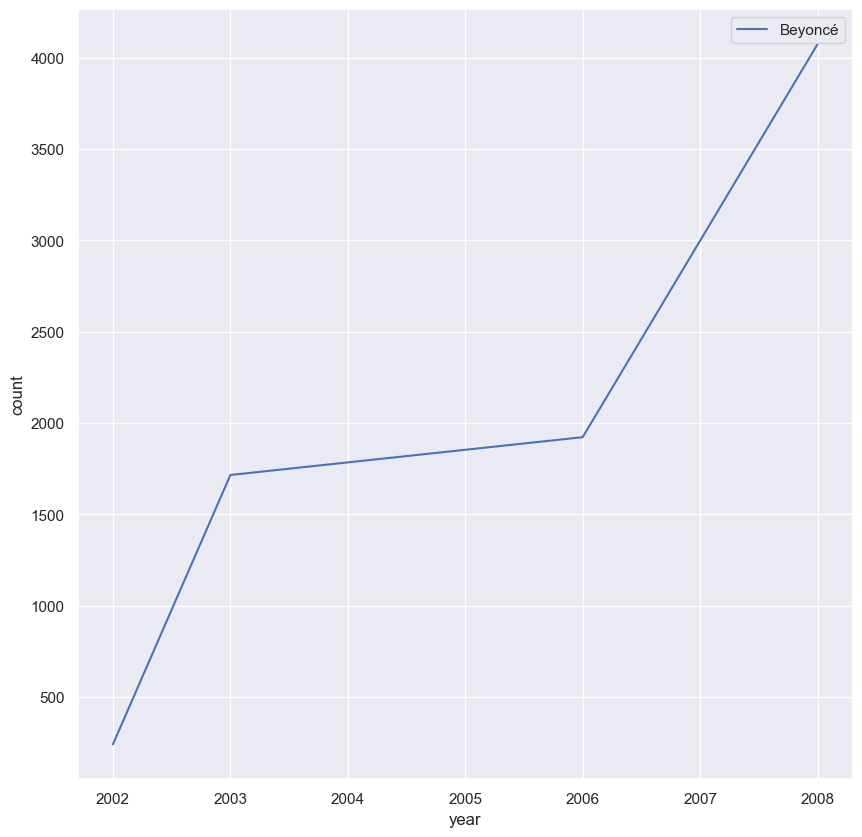

<Figure size 1000x1000 with 0 Axes>

In [43]:
art =data[data["artist_name"]=="Beyoncé"]
art = art.groupby("year")["listen_count"].count().to_frame("count").reset_index().sort_values(by="year",ascending=True)
index_names = art[ art['year'] == 0 ].index
art=art[:-1]
art=art.drop(index_names)
sns.lineplot(x='year',y='count',data=art,label="Beyoncé")
print(art)
plt.figure(figsize=(10,10))

   year  count artist_name
1  1998    259    Coldplay
2  1999   2032    Coldplay
3  2000   6864    Coldplay
4  2001   1420    Coldplay
5  2002   9711    Coldplay
6  2005   5243    Coldplay
7  2008   3366    Coldplay
8  2009    214    Coldplay


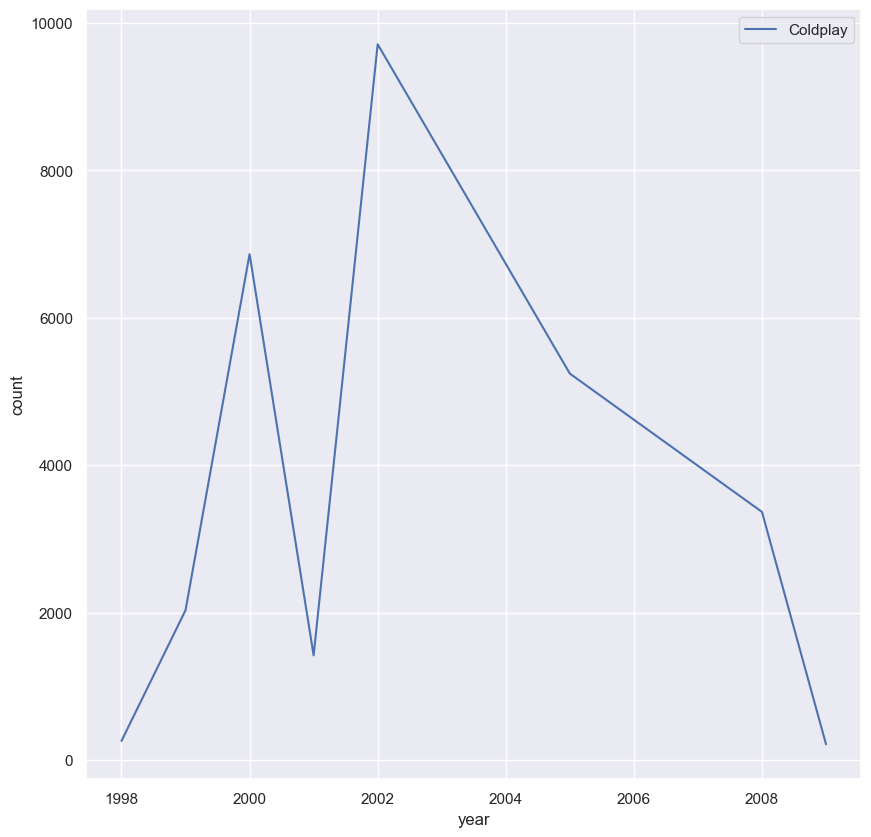

   year  count    artist_name
0  2003   2324  Kings Of Leon
1  2004   1362  Kings Of Leon
2  2007   2556  Kings Of Leon
3  2008  12505  Kings Of Leon


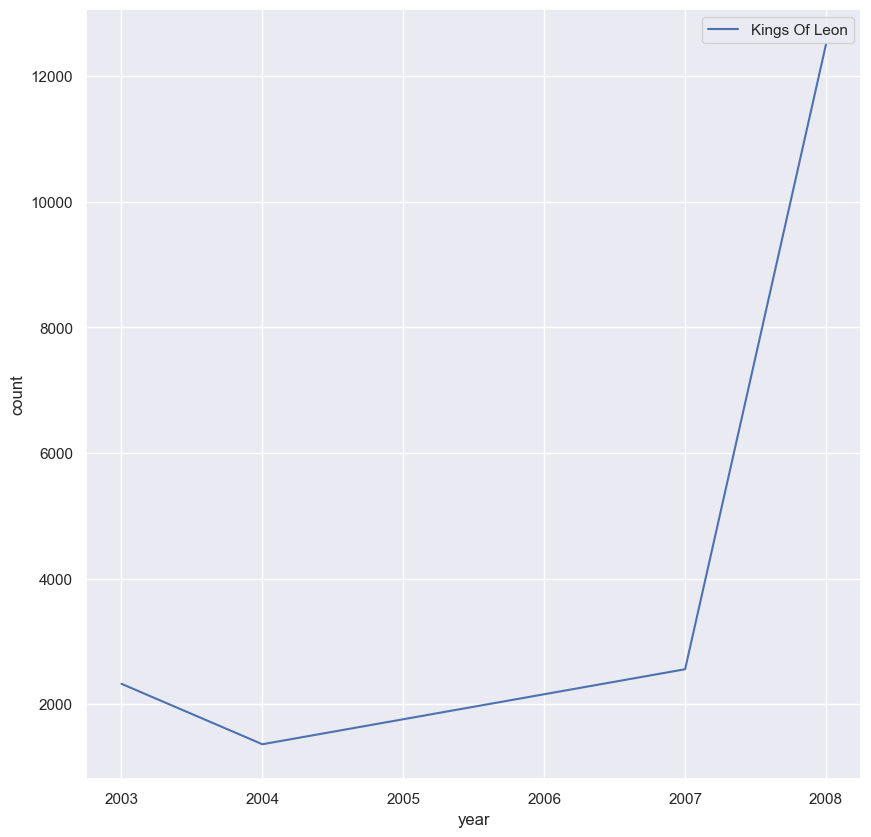

   year  count             artist_name
1  2009  10917  Florence + The Machine


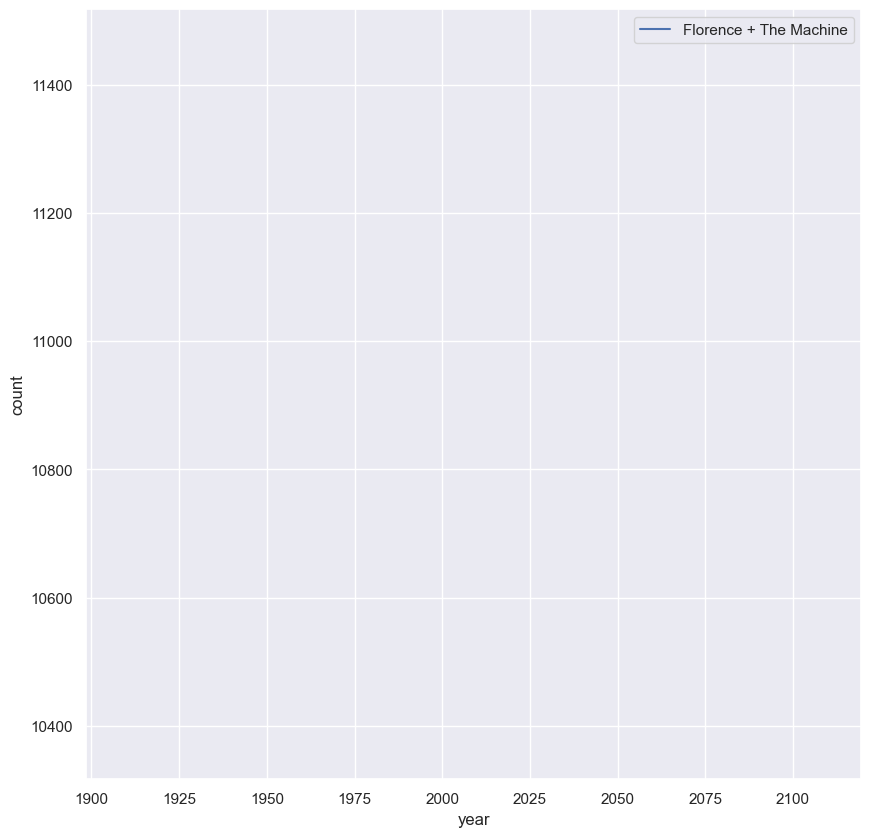

   year  count    artist_name
0  1990   6412  Dwight Yoakam


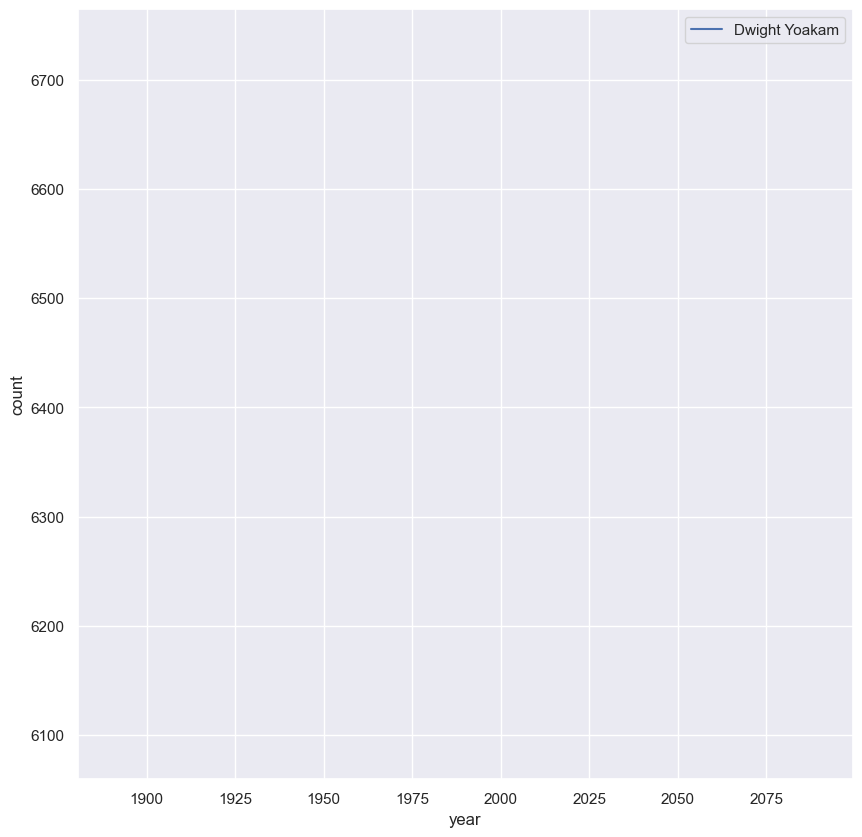

   year  count artist_name
0  1993    518       Björk
1  1994    113       Björk
2  1995    672       Björk
3  1997     79       Björk
4  2001   7137       Björk


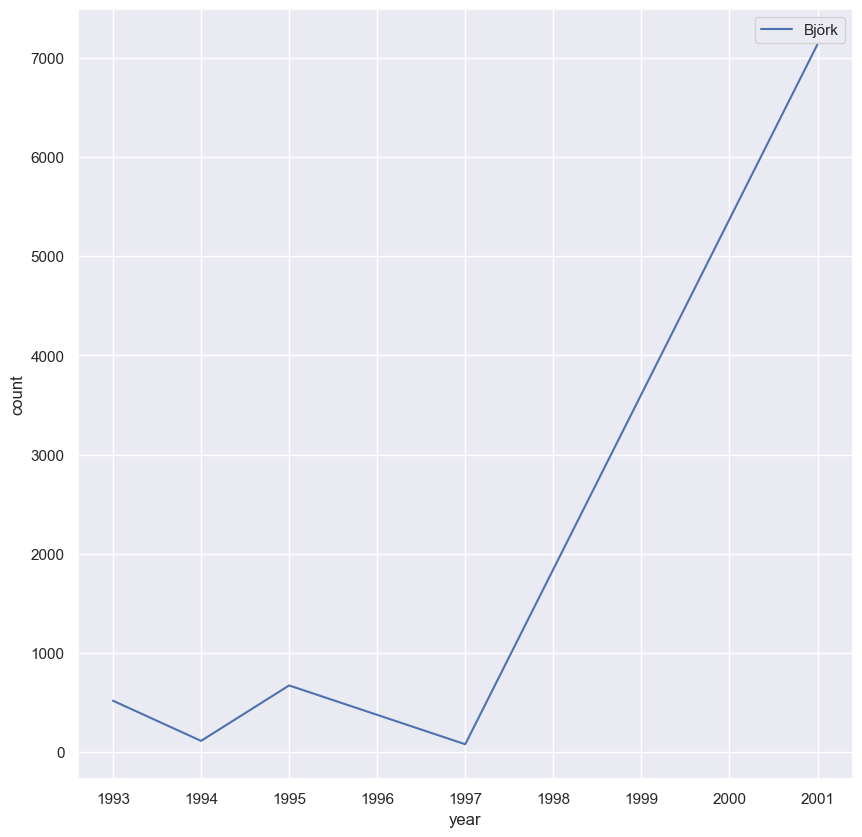

   year  count     artist_name
0  2002   2748  The Black Keys
1  2003    967  The Black Keys
2  2004   3170  The Black Keys
3  2006   3414  The Black Keys
4  2008   2339  The Black Keys
5  2010   7224  The Black Keys


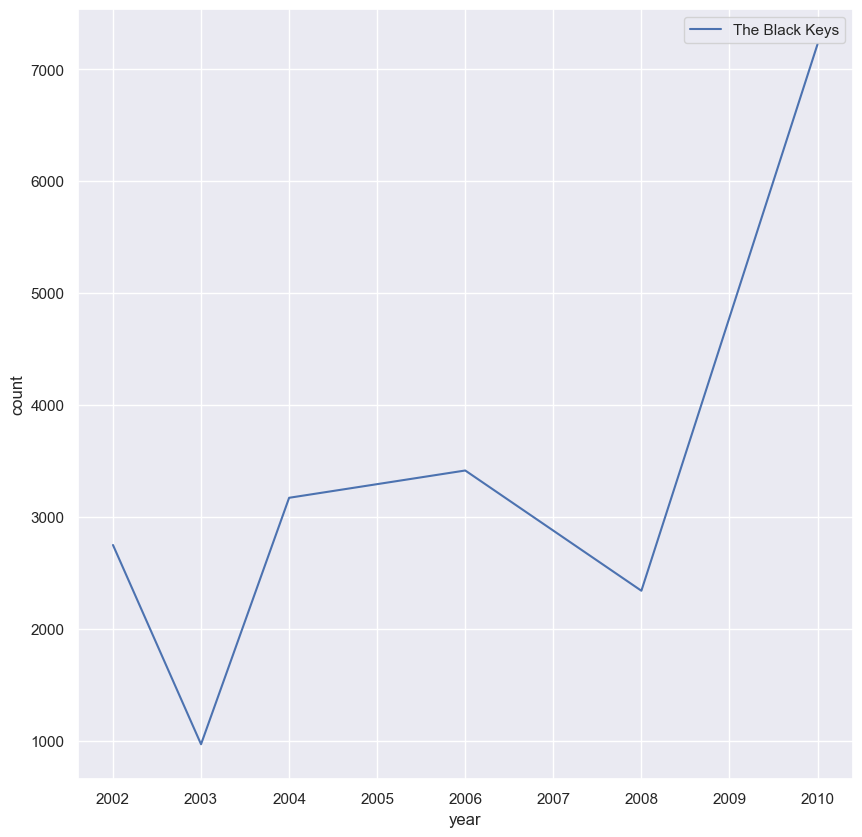

   year  count   artist_name
1  2000   3704  Jack Johnson
2  2003   4305  Jack Johnson
3  2005   5569  Jack Johnson
4  2006   1502  Jack Johnson
5  2008   1582  Jack Johnson
6  2009    367  Jack Johnson
7  2010    466  Jack Johnson


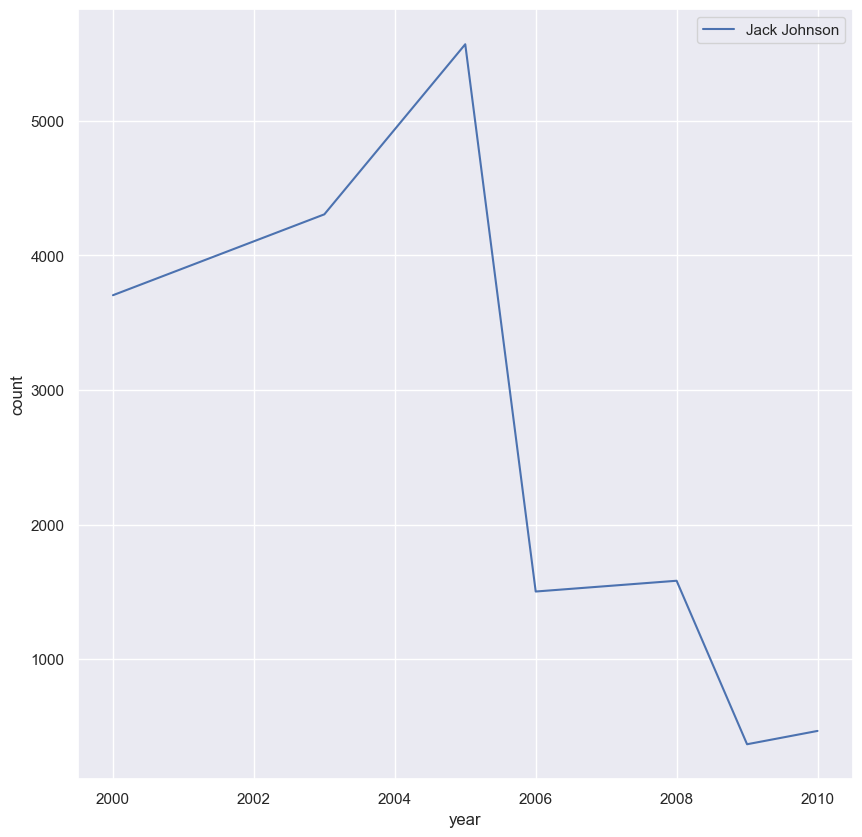

   year  count    artist_name
0  2009   5646  Justin Bieber
1  2010   8313  Justin Bieber


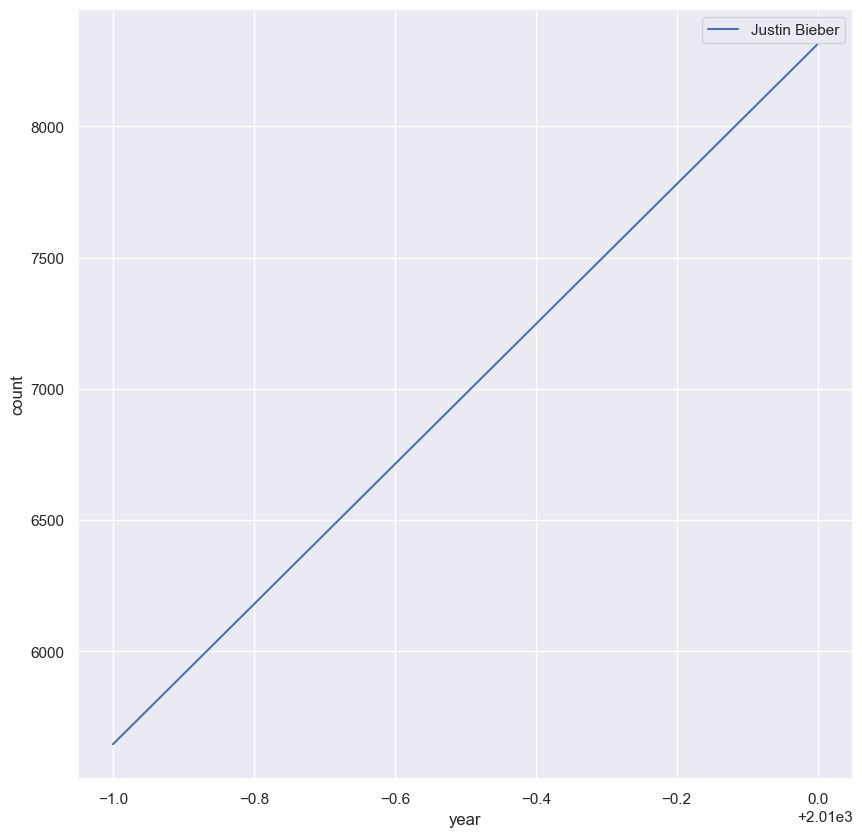

   year  count  artist_name
0  2007   2007  OneRepublic
1  2009   9469  OneRepublic


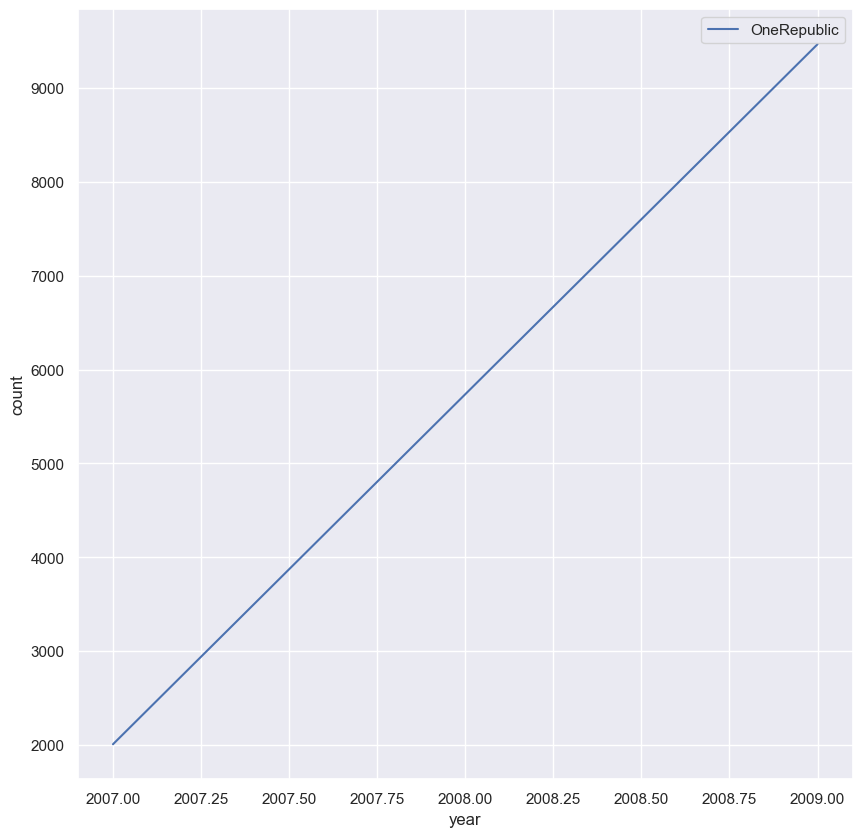

   year  count artist_name
1  1996    299       Train
2  2001    927       Train
3  2003    297       Train
4  2004     67       Train
5  2006   1398       Train
6  2009   4504       Train


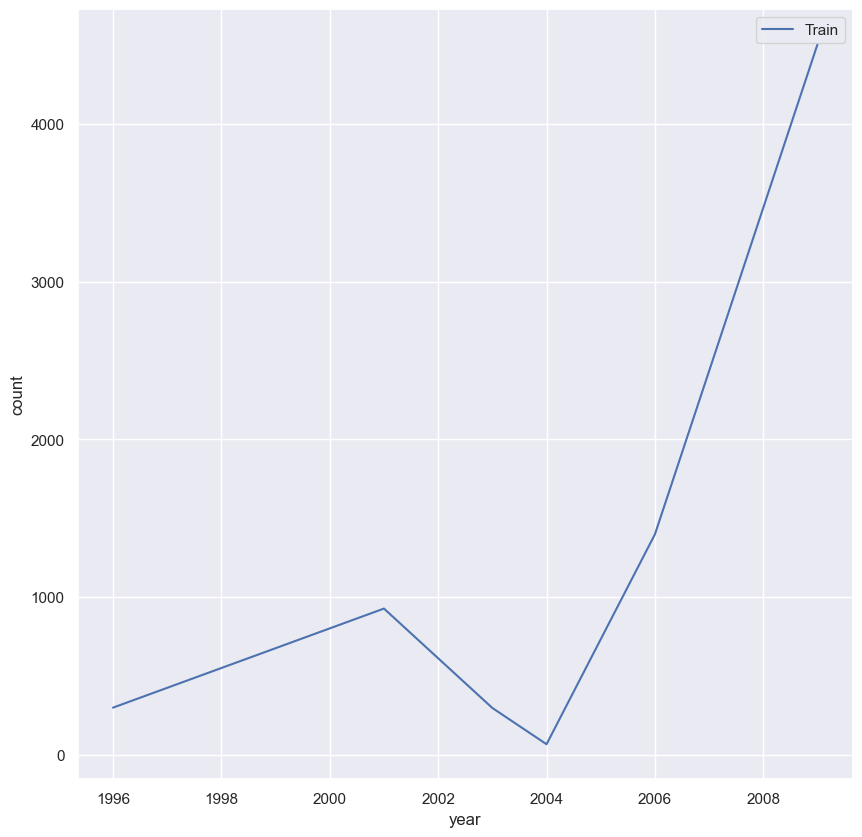

   year  count      artist_name
1  1999   3845  Alliance Ethnik


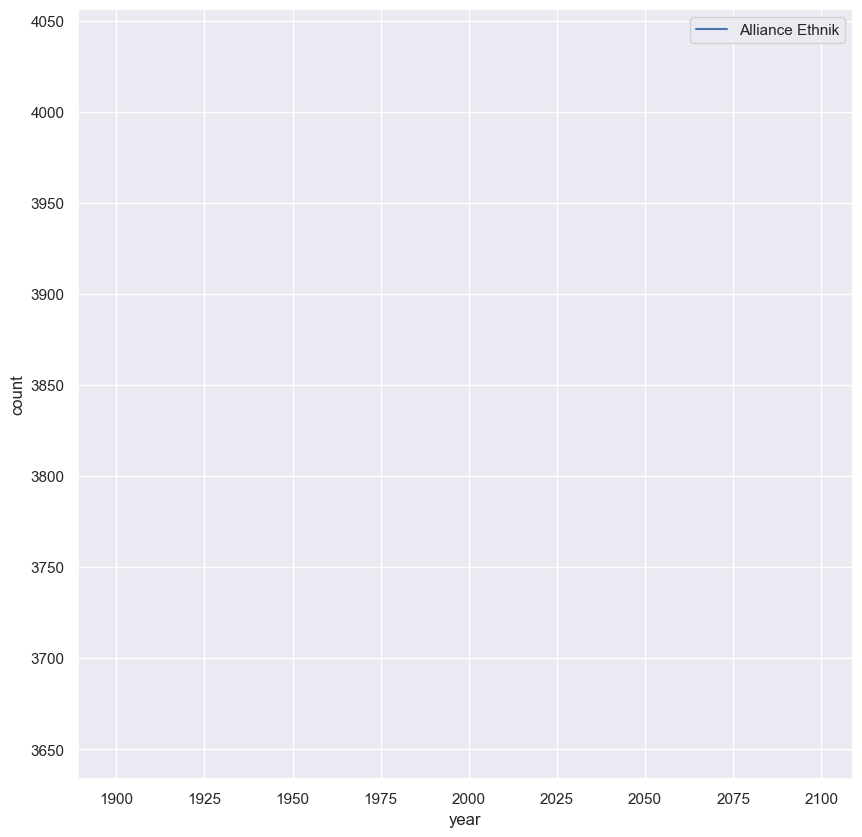

Empty DataFrame
Columns: [year, count, artist_name]
Index: []


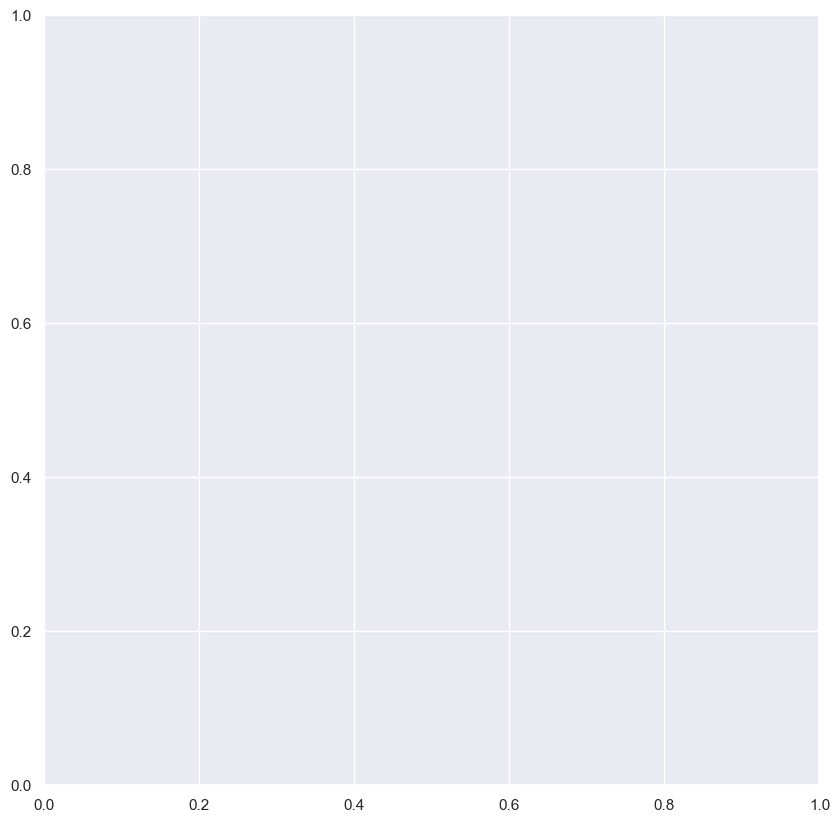

    year  count artist_name
1   1992    529   Radiohead
2   1993   3370   Radiohead
3   1994    310   Radiohead
4   1995   1972   Radiohead
5   1996     85   Radiohead
6   1997   3032   Radiohead
7   2000   1186   Radiohead
8   2001    746   Radiohead
9   2003    893   Radiohead
10  2007   2400   Radiohead
11  2008    274   Radiohead


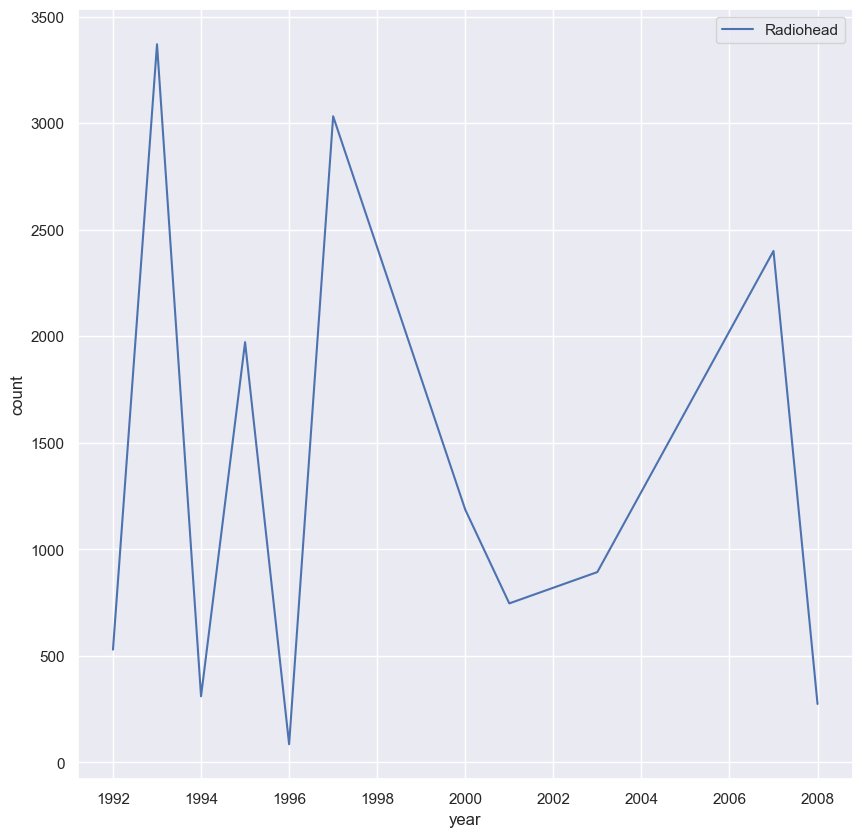

   year  count  artist_name
0  2000   4420  Linkin Park
1  2002    208  Linkin Park
2  2003   1319  Linkin Park
3  2007   2137  Linkin Park
4  2008   2690  Linkin Park
5  2009    805  Linkin Park


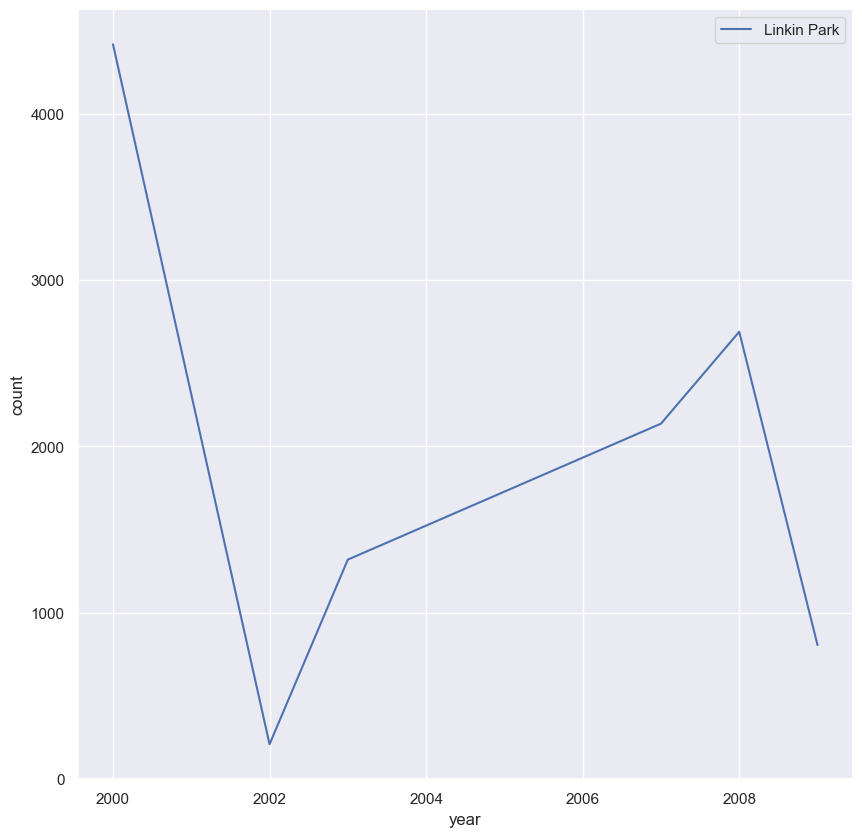

   year  count  artist_name
0  2003    747  The Killers
1  2004   3098  The Killers
2  2006   6285  The Killers
3  2007   1597  The Killers
4  2008   4336  The Killers


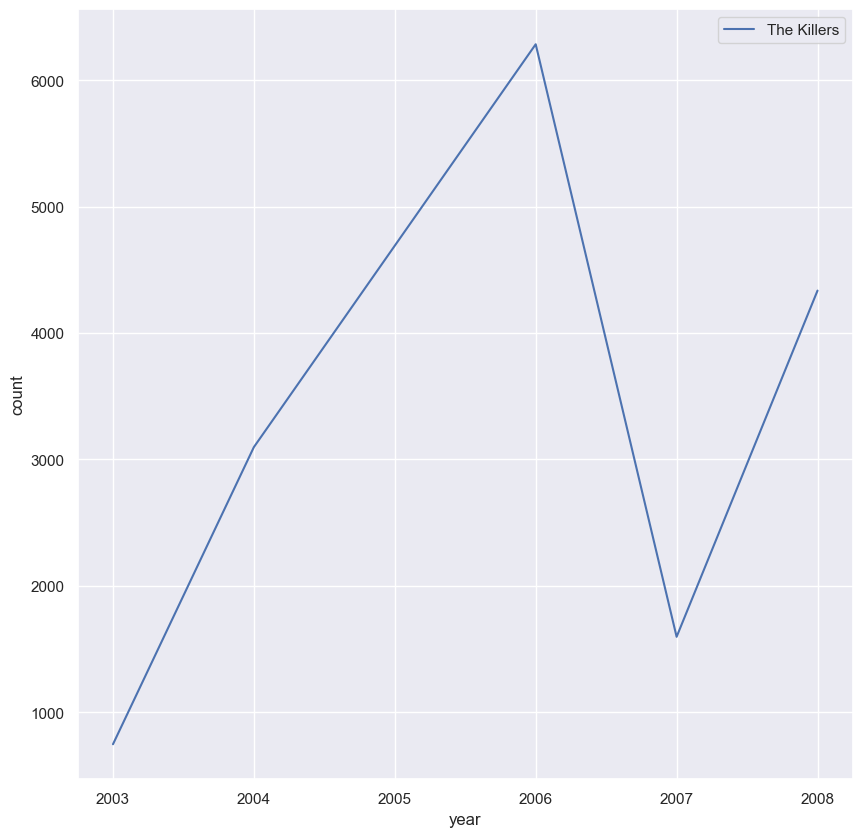

    year  count artist_name
0   1982    385   Metallica
1   1983    453   Metallica
2   1984   1755   Metallica
3   1986   2490   Metallica
4   1987    389   Metallica
5   1988   1217   Metallica
6   1989    111   Metallica
7   1991   1588   Metallica
8   1996    897   Metallica
9   1997    406   Metallica
10  1998     86   Metallica
11  1999    167   Metallica
12  2003     60   Metallica
13  2006    187   Metallica
14  2008   1145   Metallica


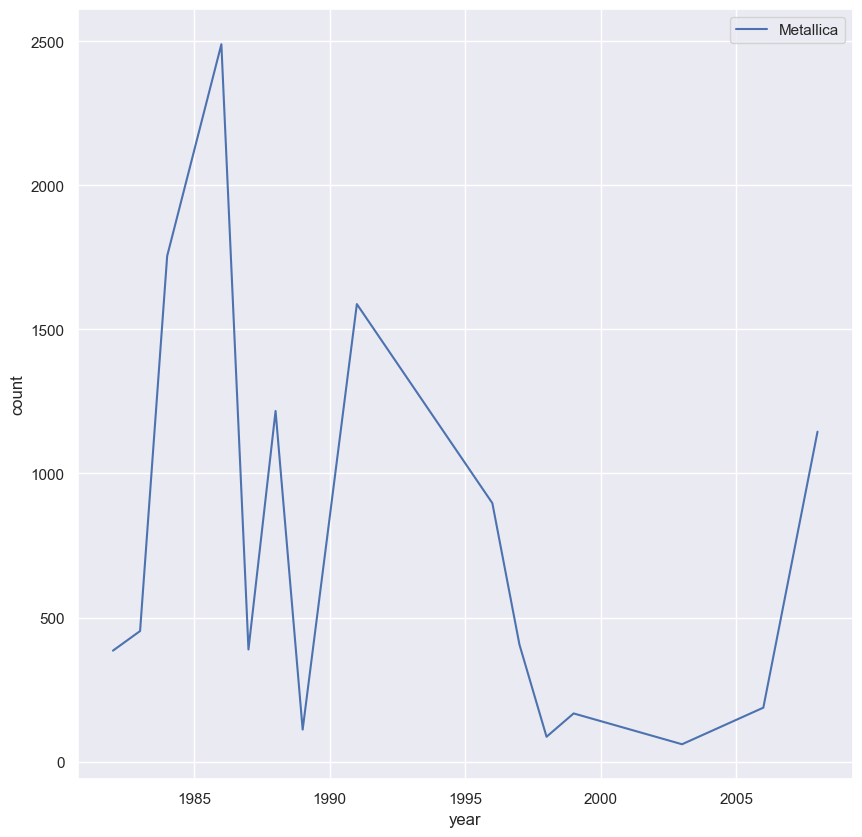

   year  count artist_name
1  1994    122   Daft Punk
2  1995    354   Daft Punk
3  1996   1896   Daft Punk
4  1997    220   Daft Punk
5  2000    862   Daft Punk
6  2001   3714   Daft Punk
7  2003   1516   Daft Punk
8  2005   2613   Daft Punk
9  2007   3251   Daft Punk


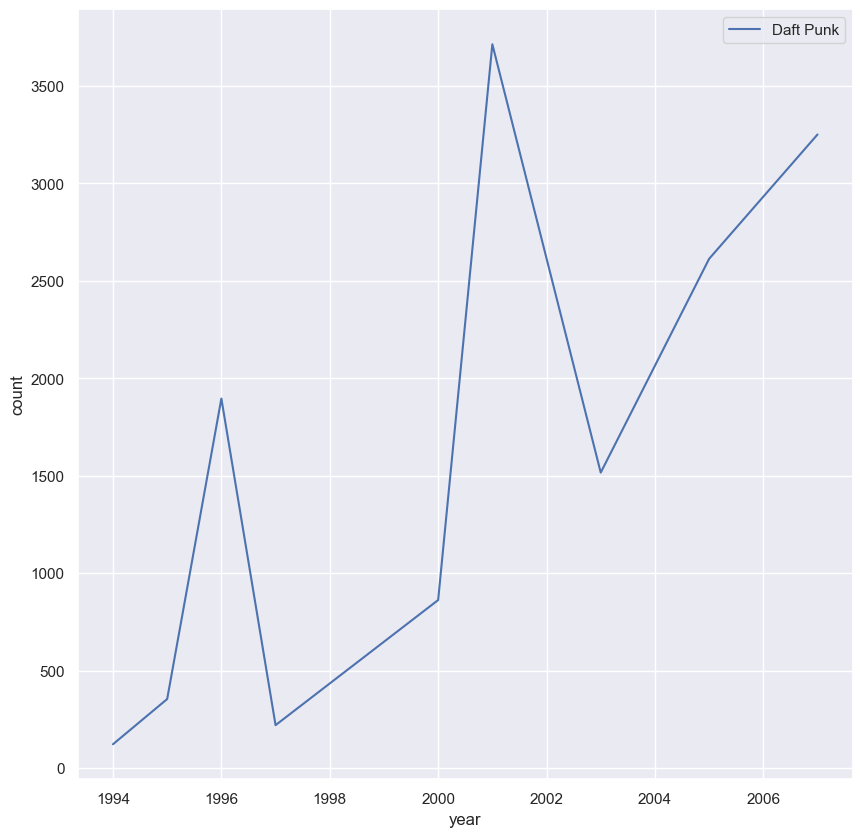

   year  count artist_name
0  1999   2338      Eminem
1  2000   2359      Eminem
2  2002   3341      Eminem
3  2004   2761      Eminem
4  2005    137      Eminem
5  2006     81      Eminem
6  2009   1121      Eminem


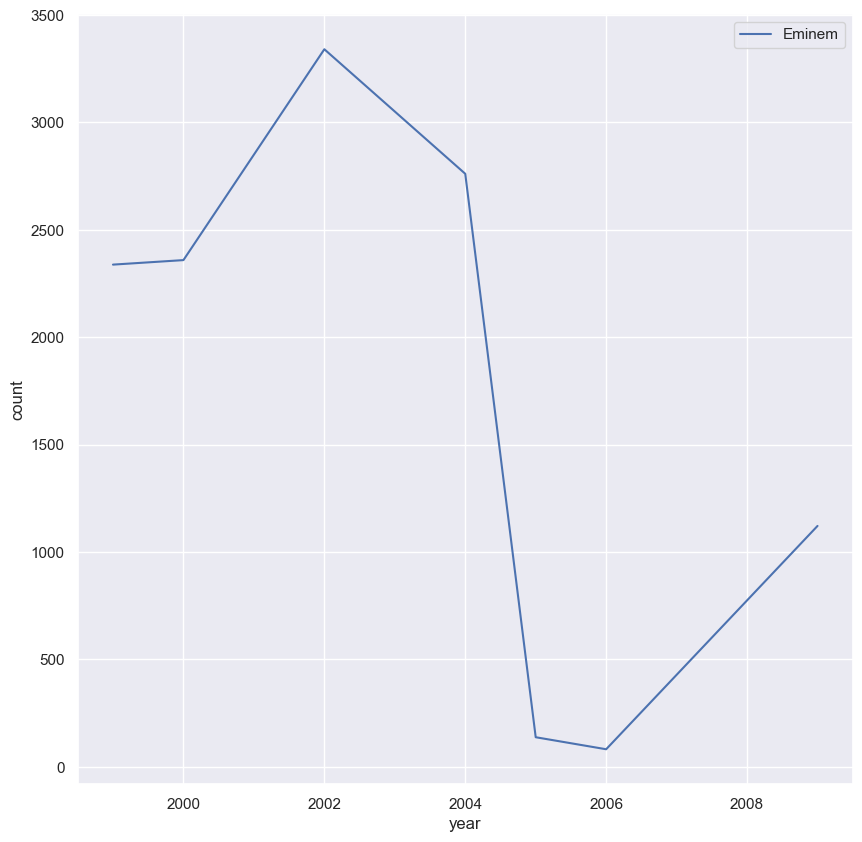

Empty DataFrame
Columns: [year, count, artist_name]
Index: []


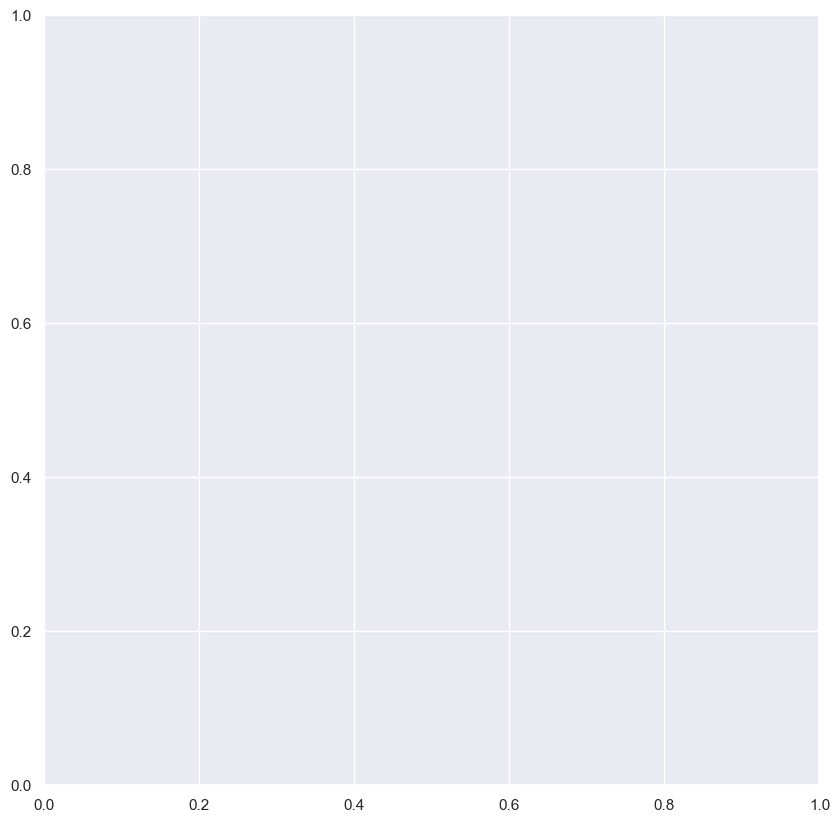

Empty DataFrame
Columns: [year, count, artist_name]
Index: []


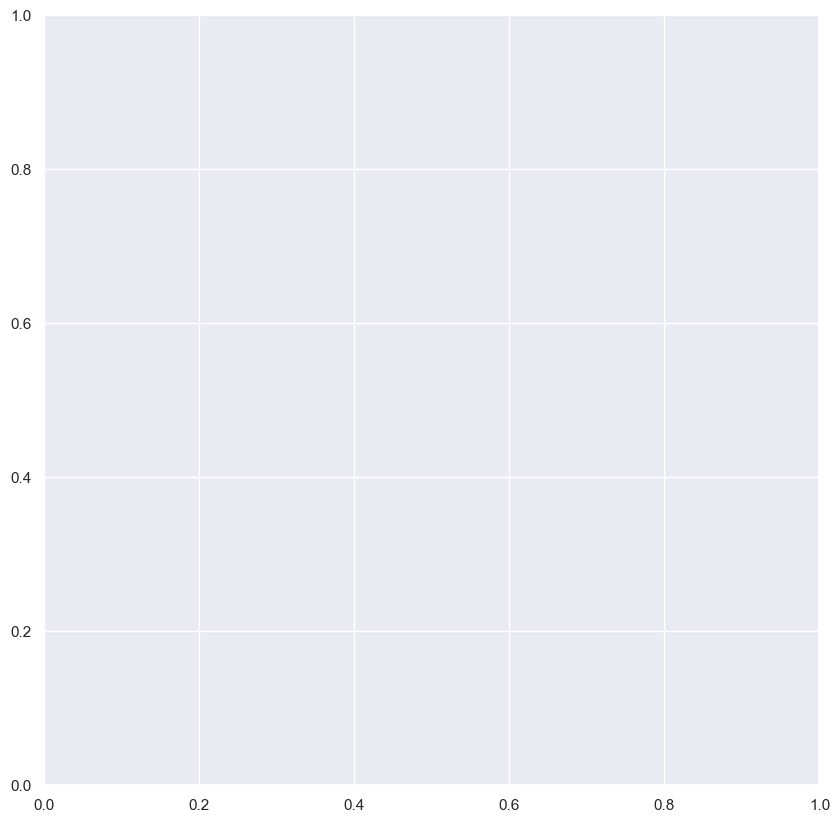

Empty DataFrame
Columns: [year, count, artist_name]
Index: []


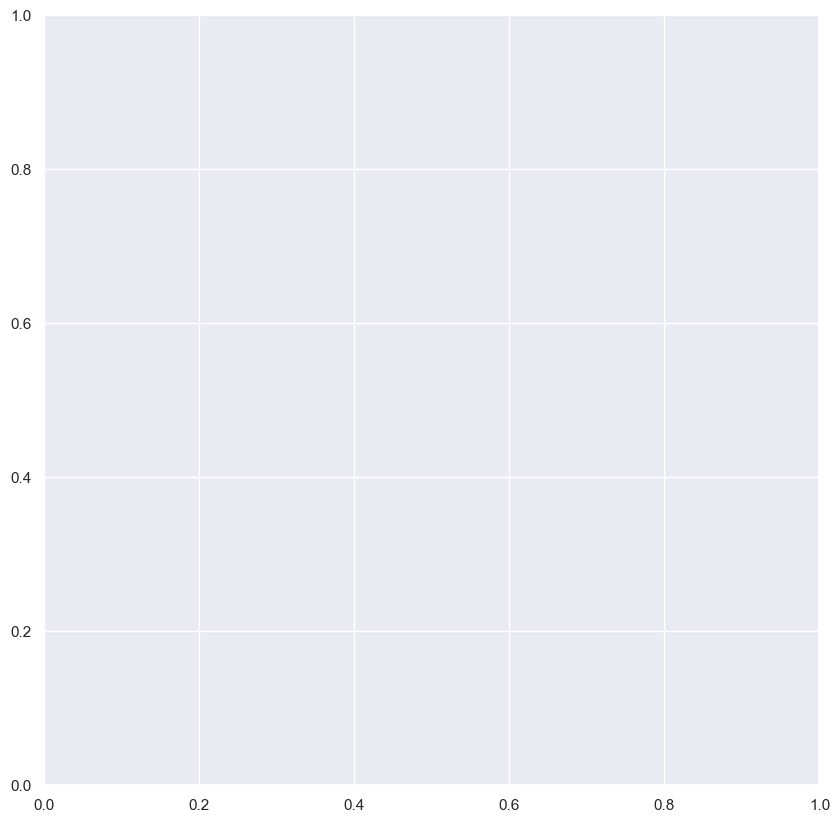

   year  count   artist_name
0  2006   2474  Taylor Swift
1  2007    622  Taylor Swift
2  2008   5821  Taylor Swift
3  2009   1055  Taylor Swift


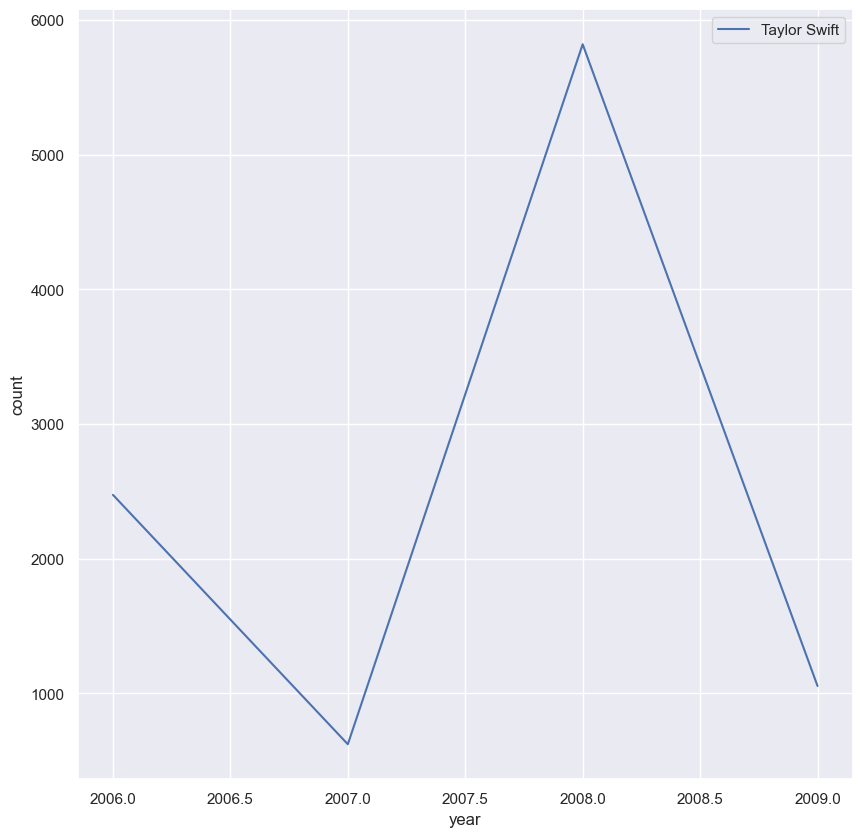

   year  count    artist_name
0  1986    271  Guns N' Roses
1  1987   3190  Guns N' Roses
2  1988   1154  Guns N' Roses
3  1991   4095  Guns N' Roses
4  1993    171  Guns N' Roses
5  1994    245  Guns N' Roses
6  2008    160  Guns N' Roses


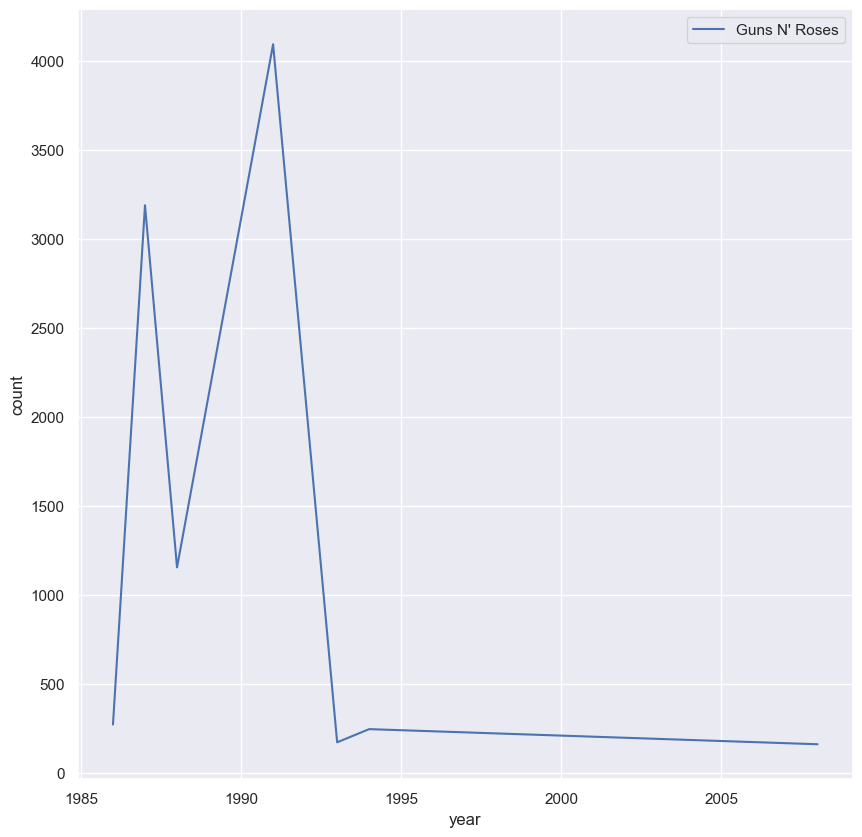

   year  count   artist_name
1  2001    228  Rise Against
2  2003    937  Rise Against
3  2004    984  Rise Against
4  2005    132  Rise Against
5  2006   1545  Rise Against
6  2008   3649  Rise Against


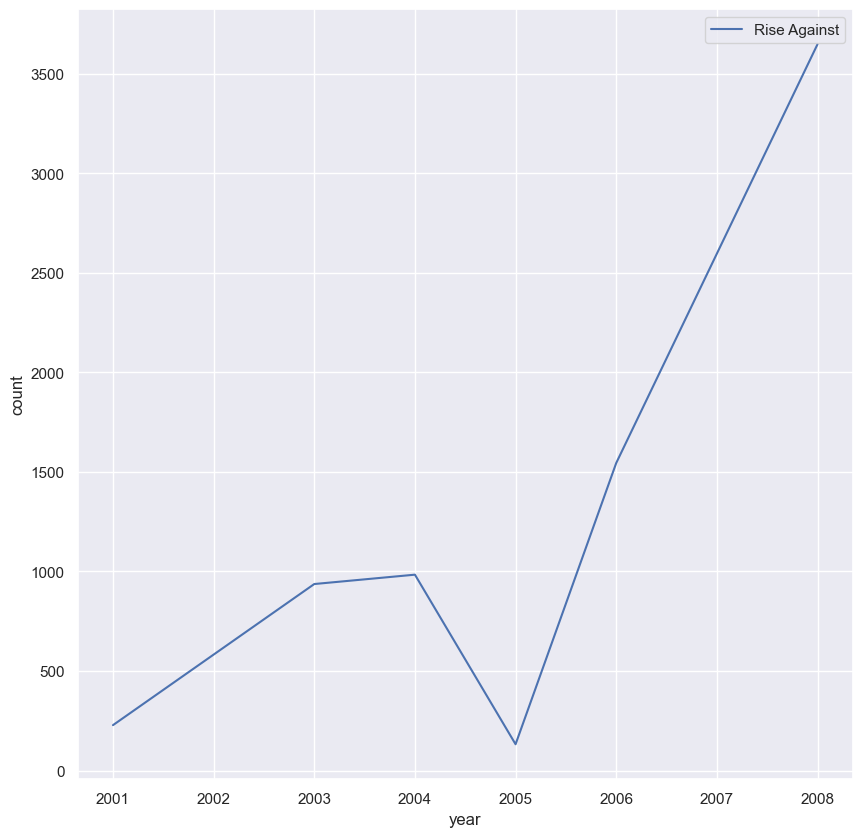

   year  count                   artist_name
0  1968    762  Creedence Clearwater Revival
1  1969   3978  Creedence Clearwater Revival
2  1970   2359  Creedence Clearwater Revival
3  1971    921  Creedence Clearwater Revival
4  1972    135  Creedence Clearwater Revival
5  1979    347  Creedence Clearwater Revival
6  2008    134  Creedence Clearwater Revival


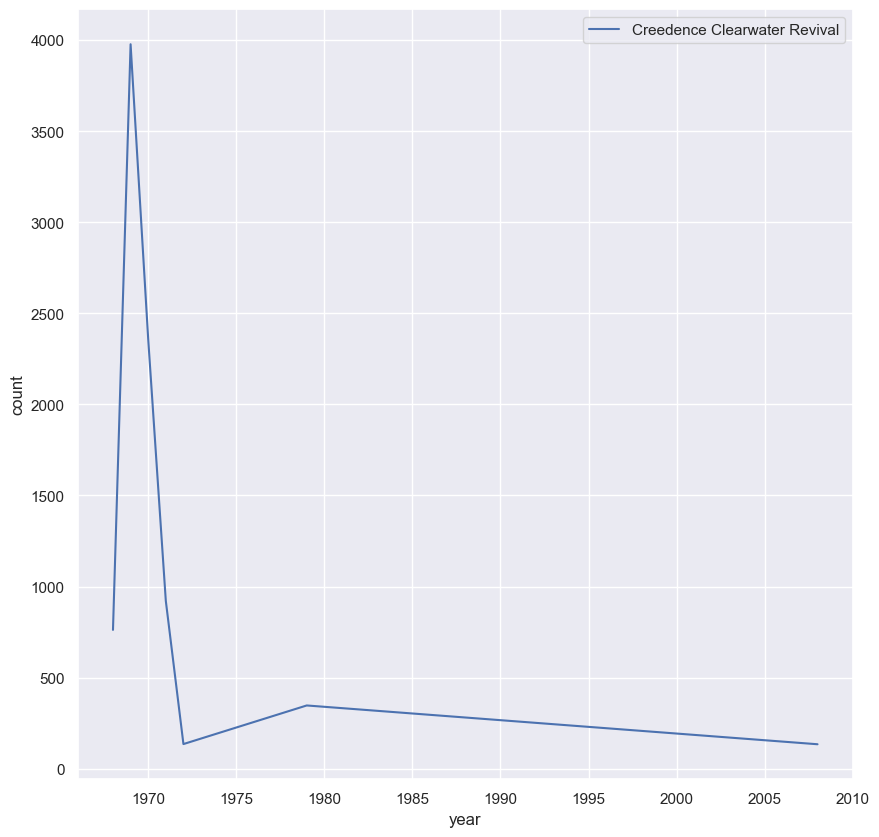

   year  count artist_name
1  2000   1604    Gorillaz
2  2001   1880    Gorillaz
3  2005   2902    Gorillaz
4  2010   1616    Gorillaz


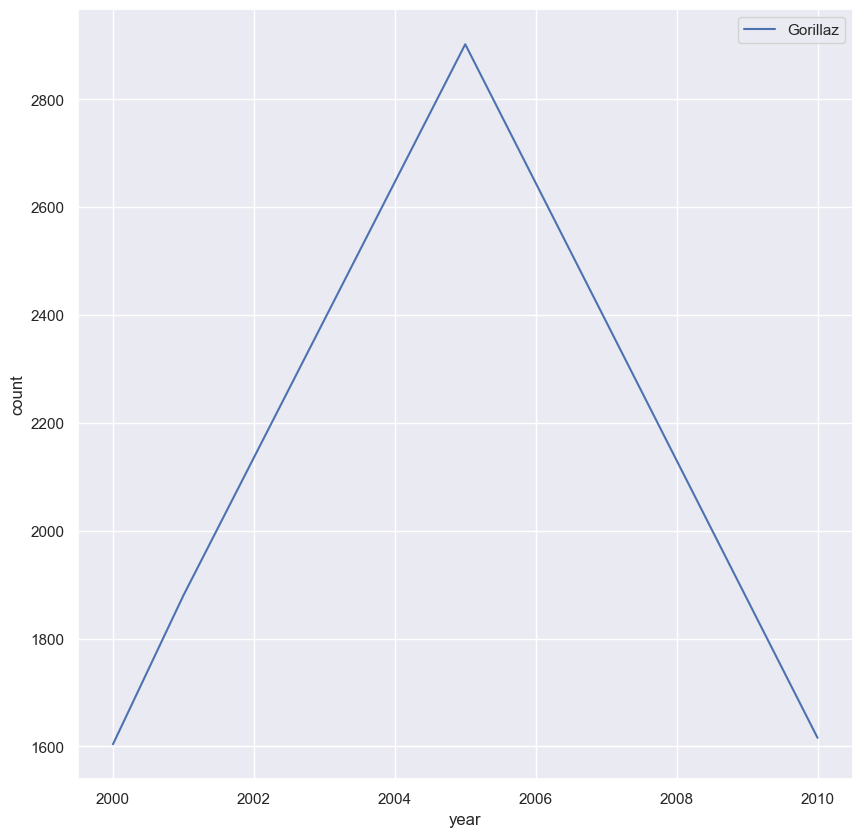

   year  count      artist_name
0  2003    610  Black Eyed Peas
1  2004    436  Black Eyed Peas
2  2005   1703  Black Eyed Peas
3  2009   5098  Black Eyed Peas


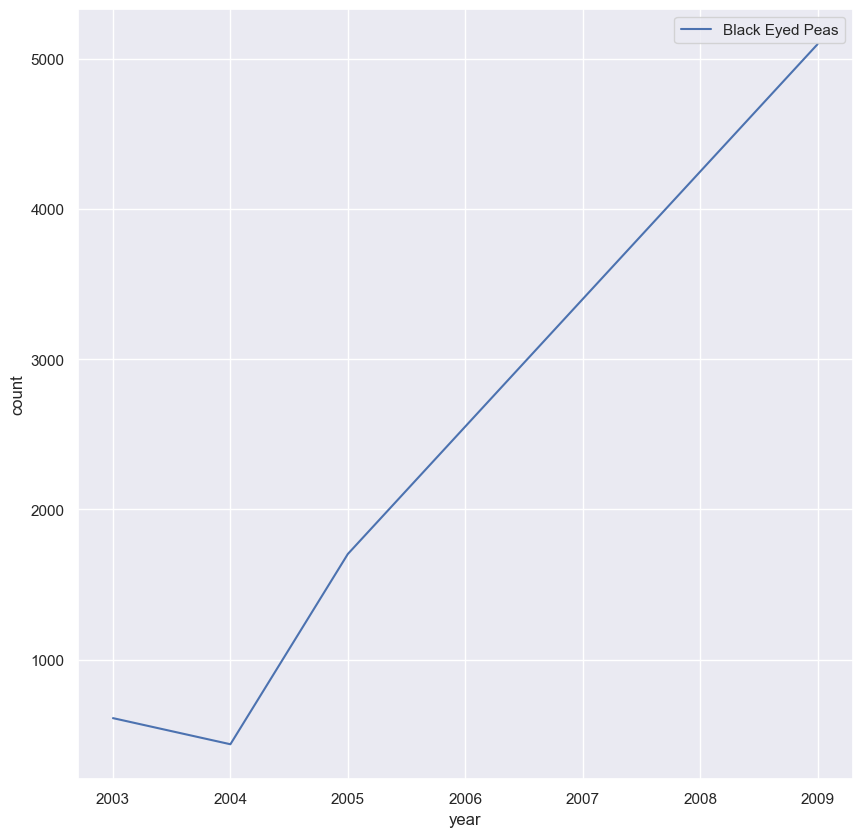

Empty DataFrame
Columns: [year, count, artist_name]
Index: []


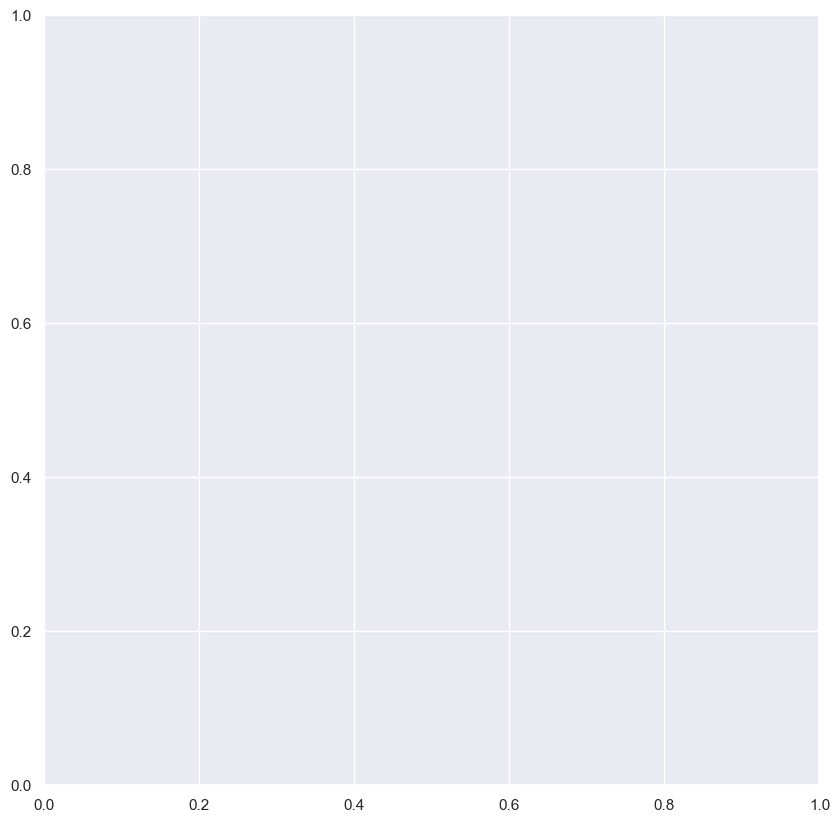

   year  count artist_name
0  2002    242     Beyoncé
1  2003   1716     Beyoncé
2  2006   1923     Beyoncé
3  2008   4074     Beyoncé
4  2009    173     Beyoncé


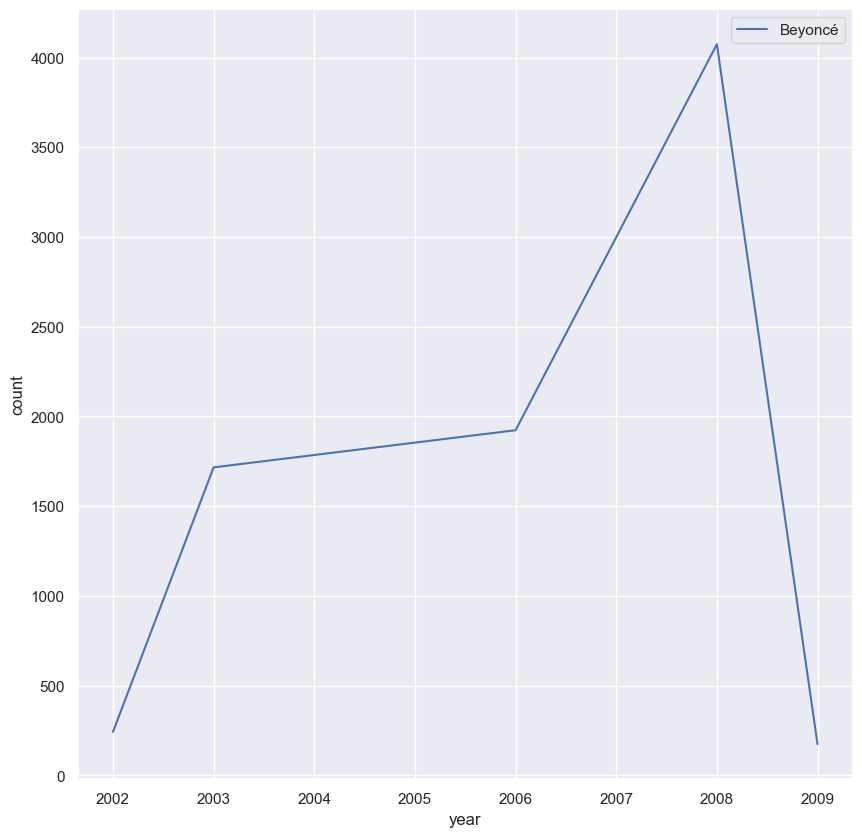

   year  count   artist_name
0  1997   2428  3 Doors Down
1  1999     74  3 Doors Down
2  2002   2550  3 Doors Down
3  2005     73  3 Doors Down
4  2008   1528  3 Doors Down


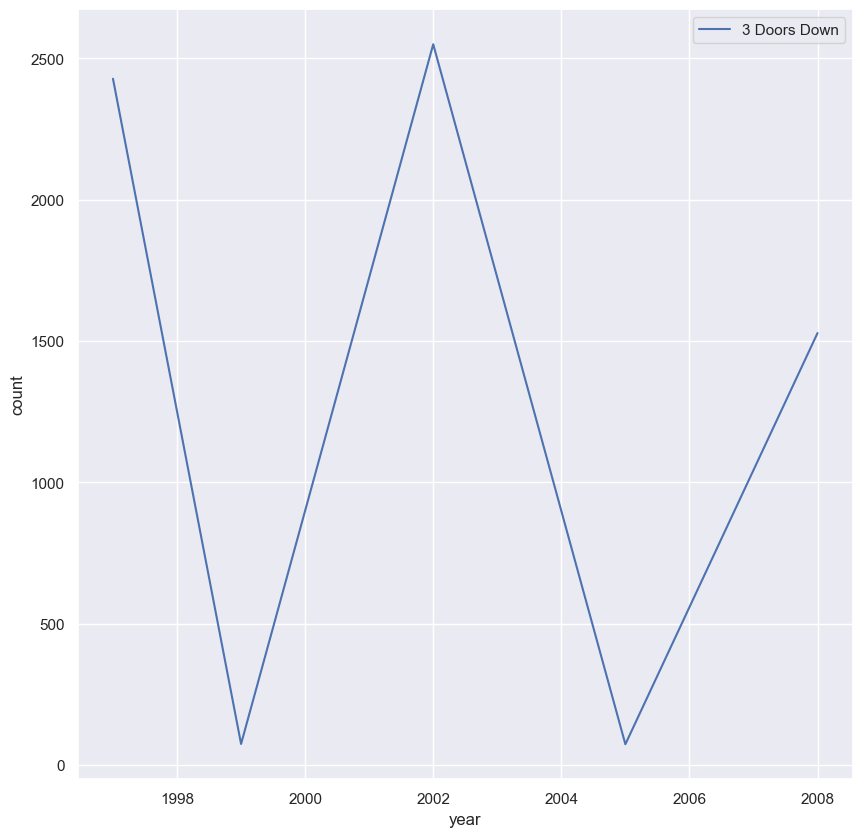

   year  count artist_name
1  1999    170  Nickelback
2  2000   1375  Nickelback
3  2001    449  Nickelback
4  2003    868  Nickelback
5  2005    619  Nickelback
6  2006   1043  Nickelback
7  2008   2259  Nickelback


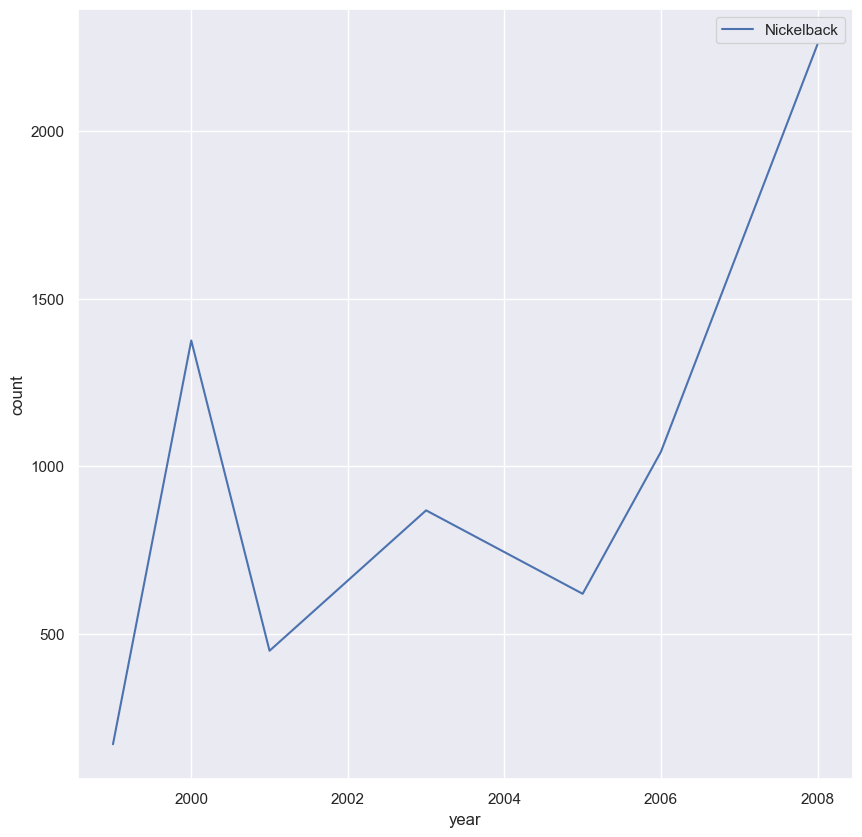

   year  count artist_name
0  2008   1794   Lady GaGa
1  2009   5573   Lady GaGa


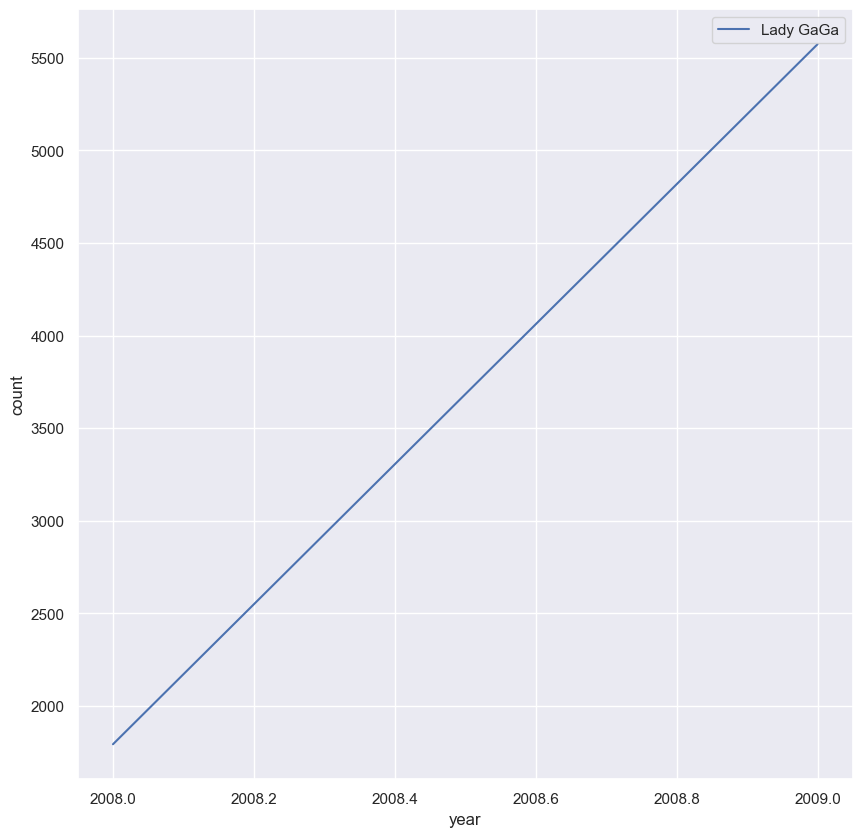

   year  count artist_name
0  1974   4548     Cartola
1  1976    907     Cartola
2  1977    398     Cartola


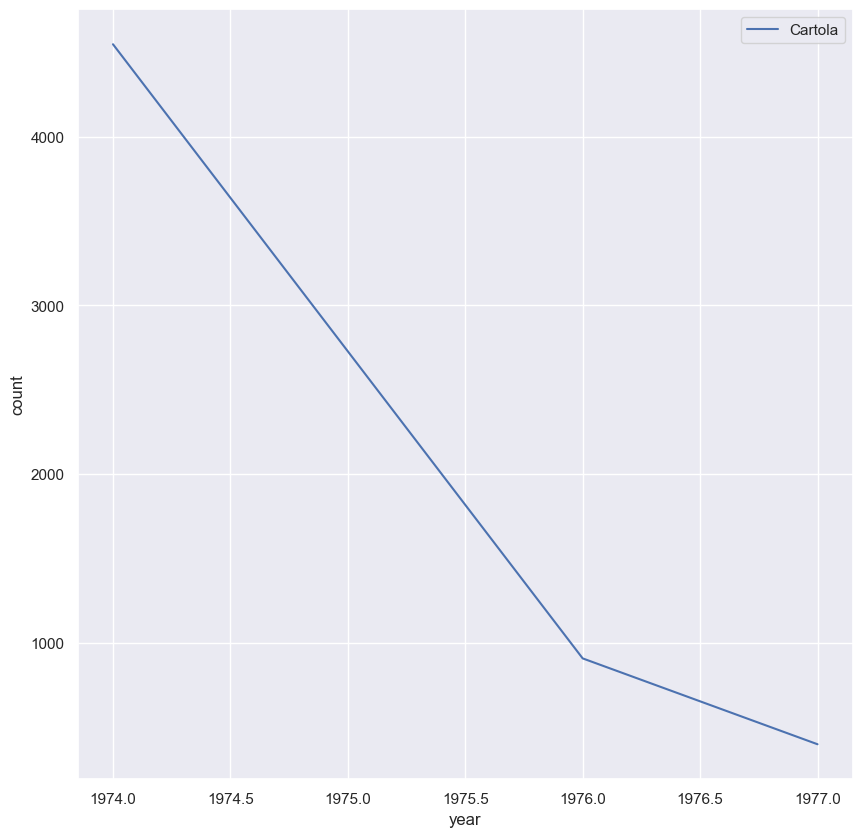

   year  count artist_name
0  2002   2887    Tub Ring


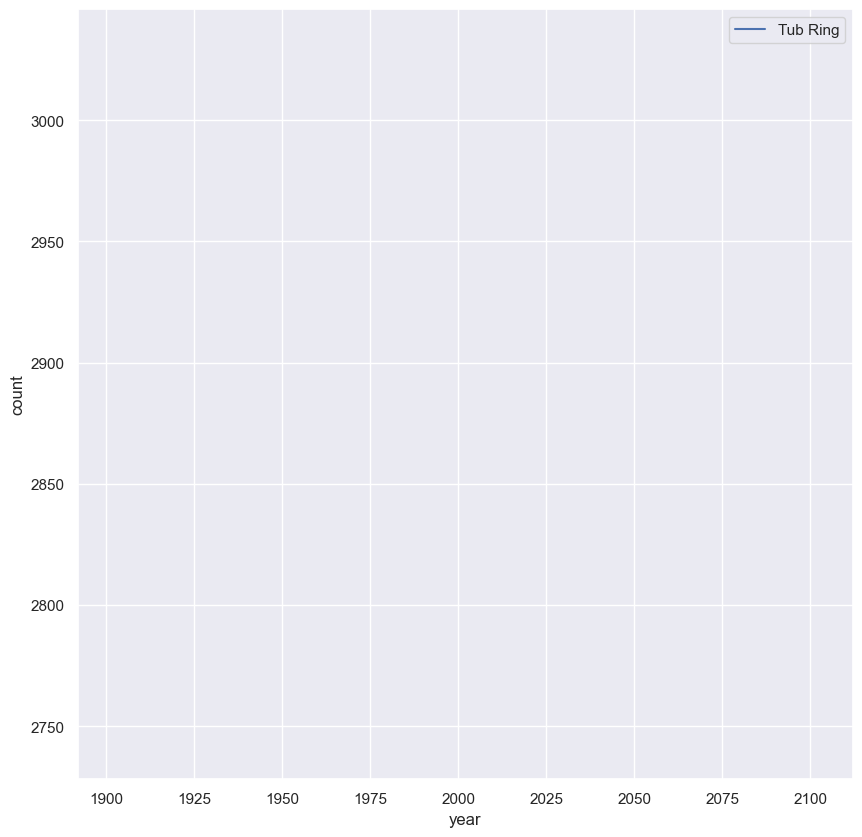

   year  count      artist_name
0  2007   5943  Vampire Weekend
1  2009   1034  Vampire Weekend
2  2010   1471  Vampire Weekend


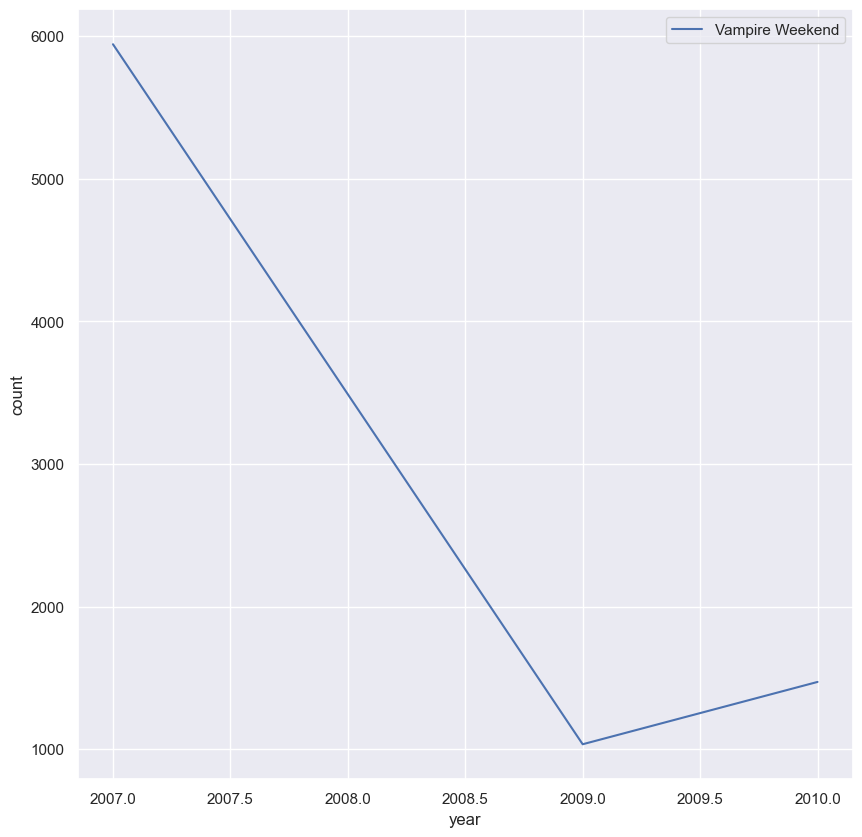

   year  count artist_name
1  1986    180   Rammstein
2  1994    495   Rammstein
3  1995    206   Rammstein
4  1997   1523   Rammstein
5  2001   1162   Rammstein
6  2003    529   Rammstein
7  2004   1038   Rammstein
8  2005    393   Rammstein
9  2009    375   Rammstein


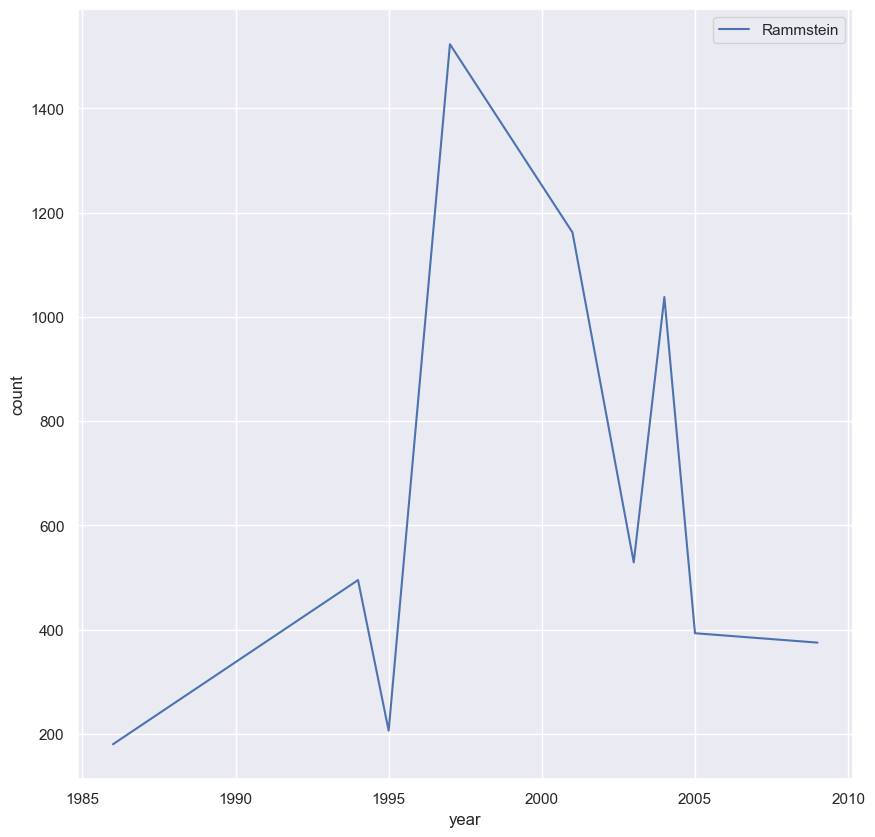

Empty DataFrame
Columns: [year, count, artist_name]
Index: []


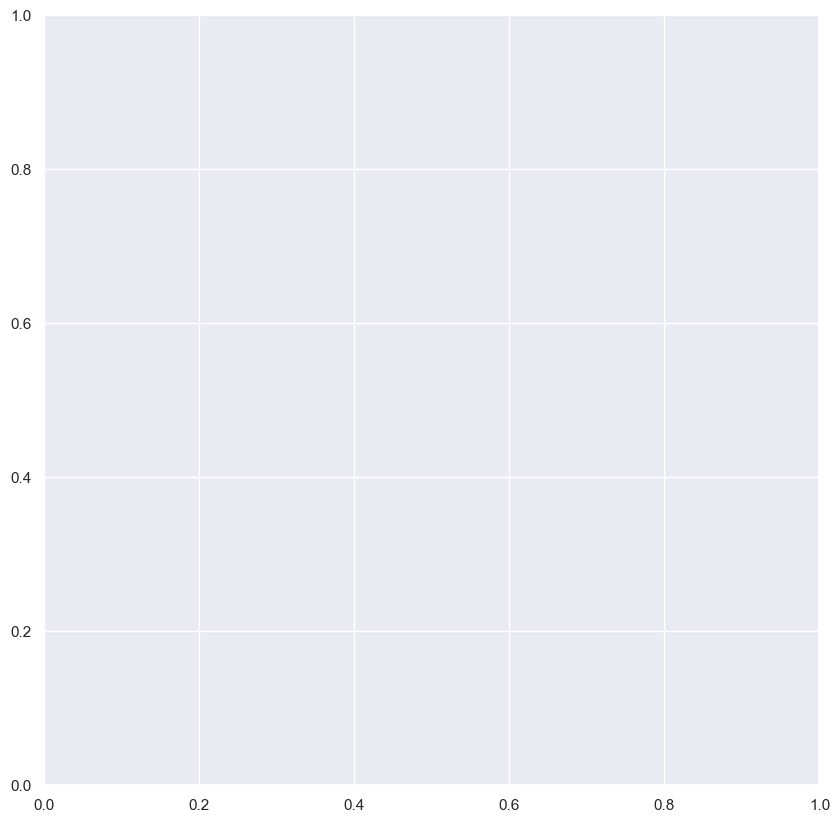

   year  count artist_name
0  2005    787     Rihanna
1  2006    698     Rihanna
2  2007   2992     Rihanna
3  2008   1348     Rihanna
4  2009   2050     Rihanna


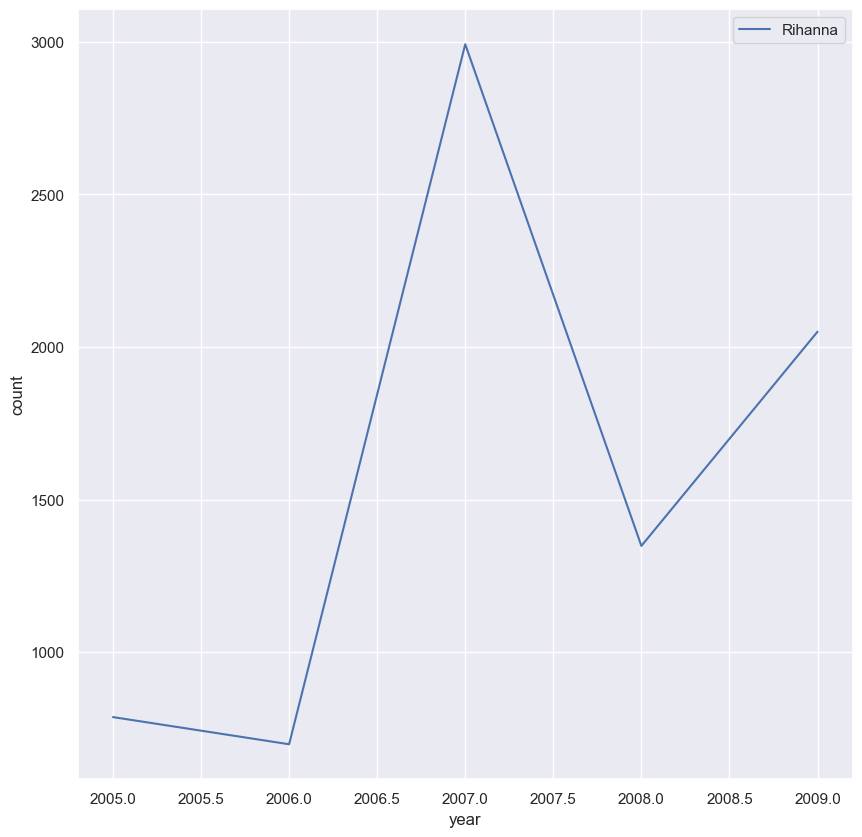

   year  count   artist_name
0  1992   2028  Foo Fighters
1  1995    578  Foo Fighters
2  1999   1601  Foo Fighters
3  2002    877  Foo Fighters
4  2005   1066  Foo Fighters
5  2007   1317  Foo Fighters


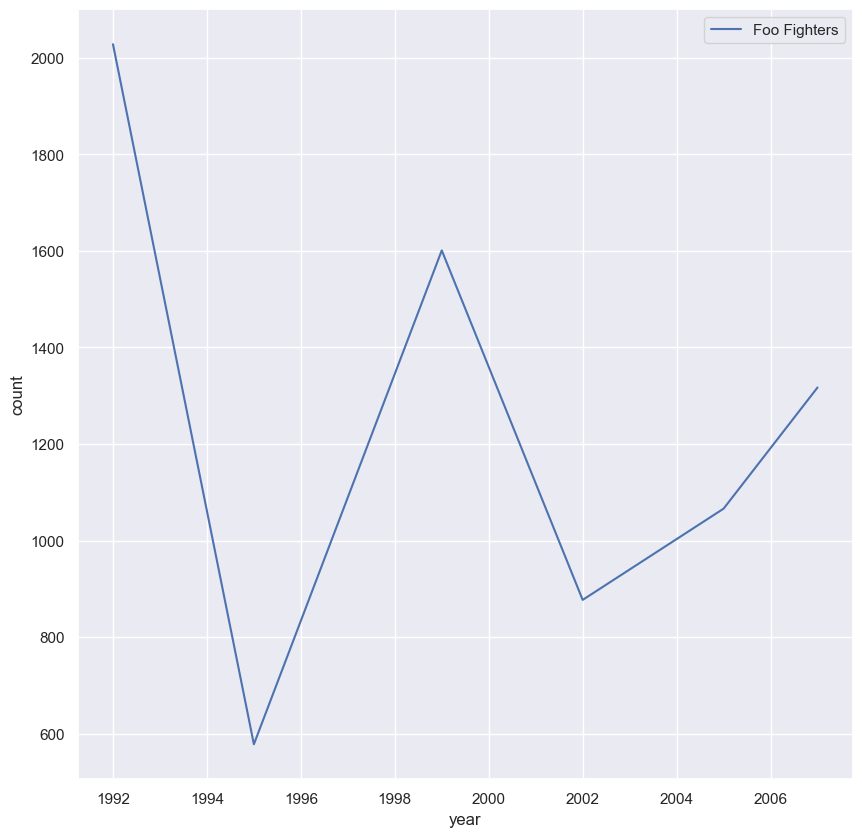

Empty DataFrame
Columns: [year, count, artist_name]
Index: []


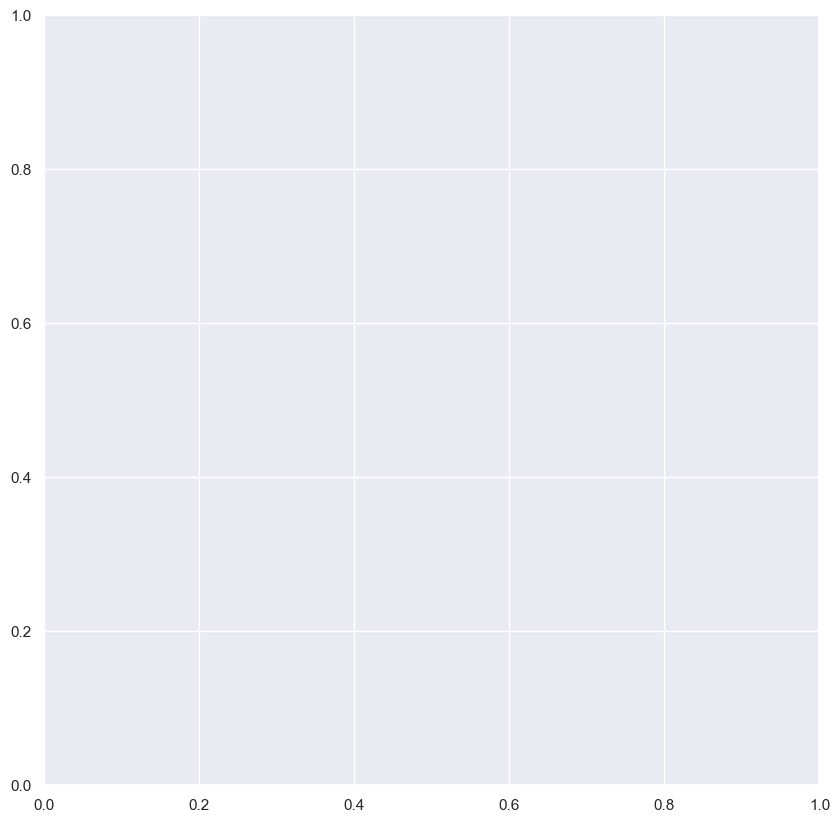

   year  count  artist_name
1  2000    198  Evanescence
2  2003   4331  Evanescence
3  2006    415  Evanescence


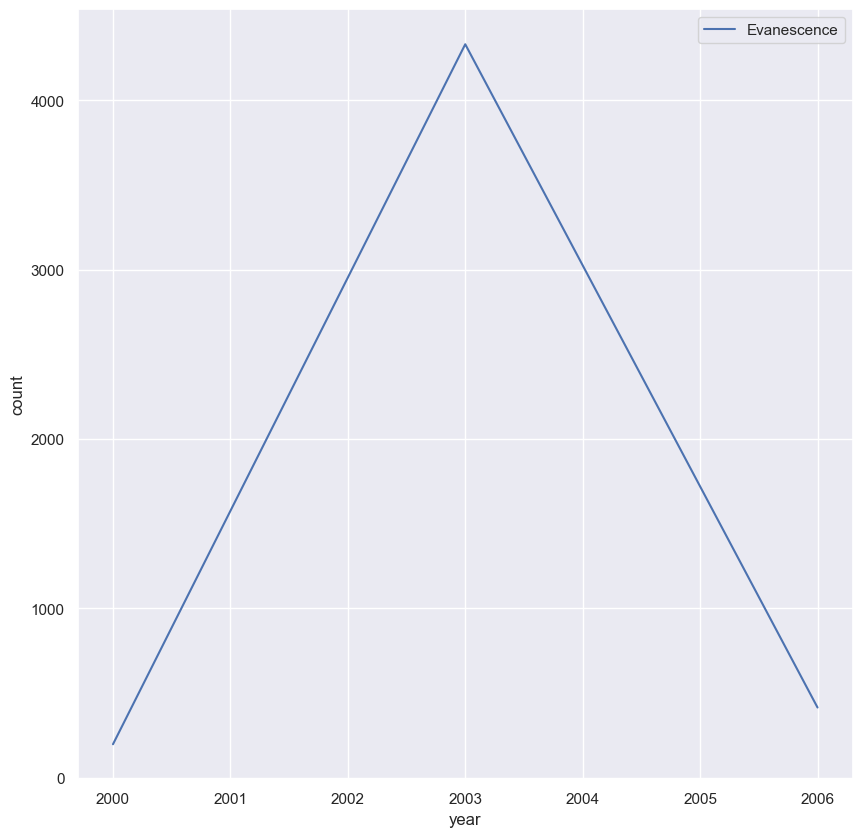

Empty DataFrame
Columns: [year, count, artist_name]
Index: []


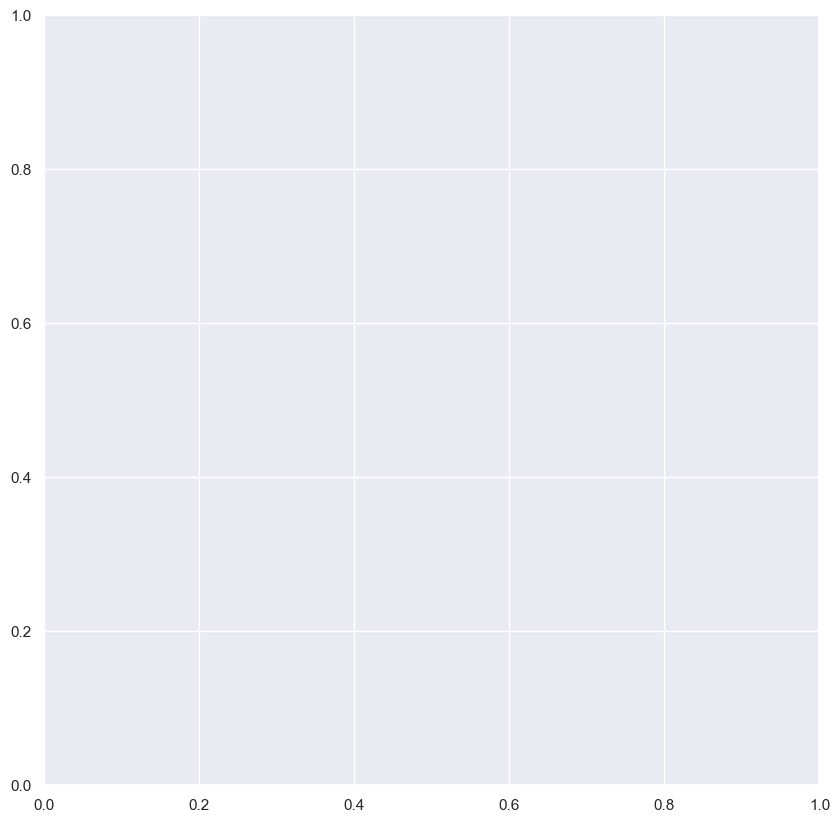

Empty DataFrame
Columns: [year, count, artist_name]
Index: []


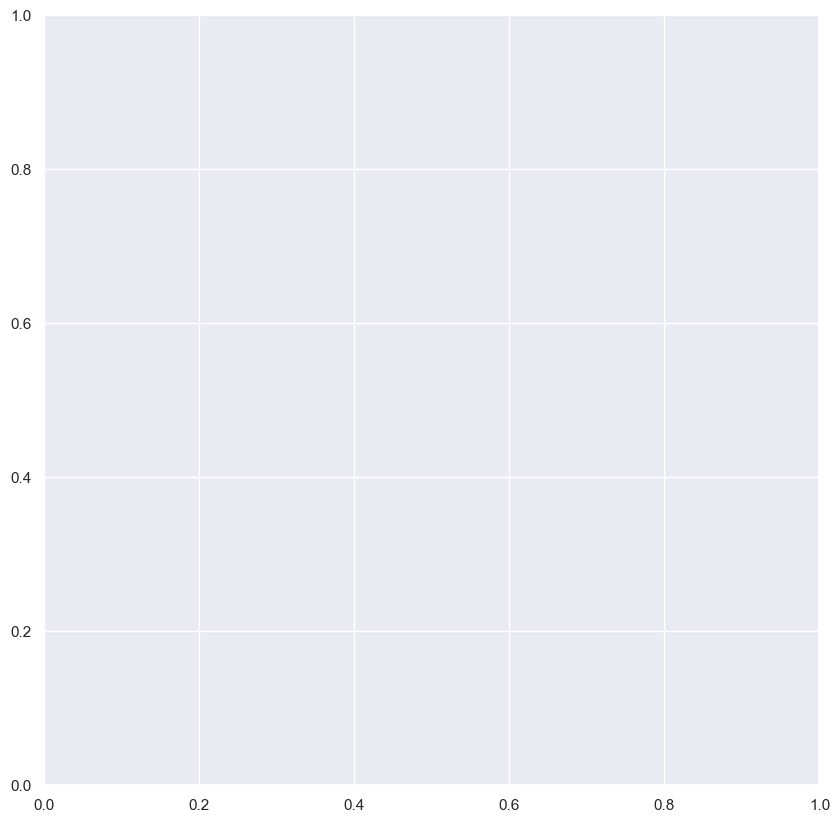

   year  count            artist_name
1  1987    170  Red Hot Chili Peppers
2  1989    424  Red Hot Chili Peppers
3  1991   1041  Red Hot Chili Peppers
4  1995    124  Red Hot Chili Peppers
5  1996     87  Red Hot Chili Peppers
6  1999    777  Red Hot Chili Peppers
7  2002    286  Red Hot Chili Peppers
8  2003   1402  Red Hot Chili Peppers
9  2007    143  Red Hot Chili Peppers


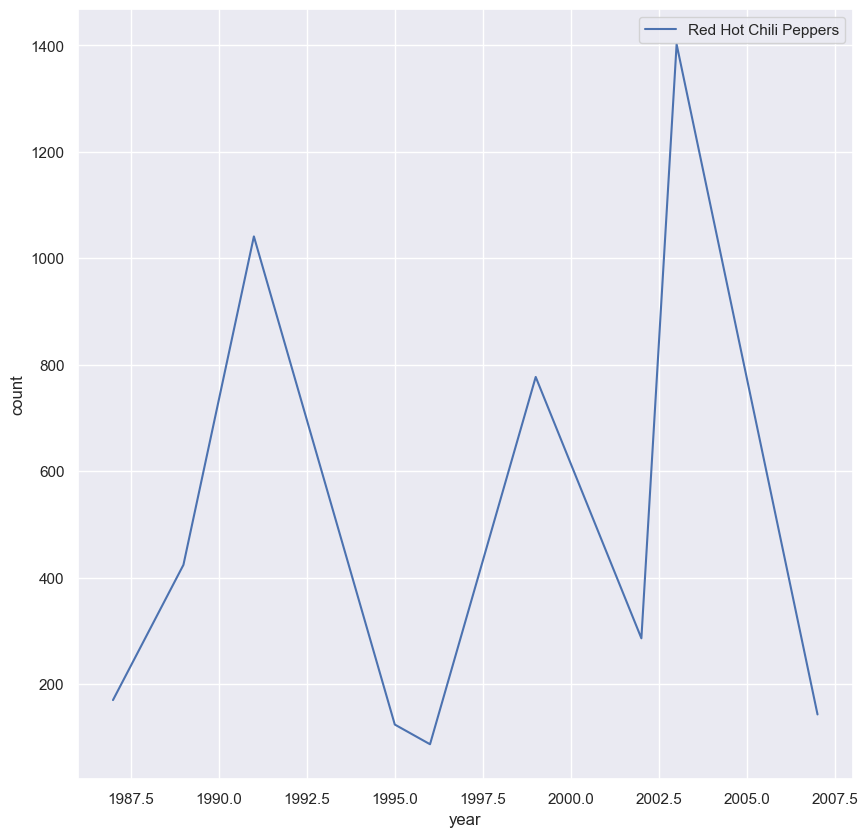

   year  count               artist_name
0  2001   1055  The All-American Rejects
1  2003   2517  The All-American Rejects
2  2005   1416  The All-American Rejects
3  2008   3194  The All-American Rejects
4  2009    224  The All-American Rejects


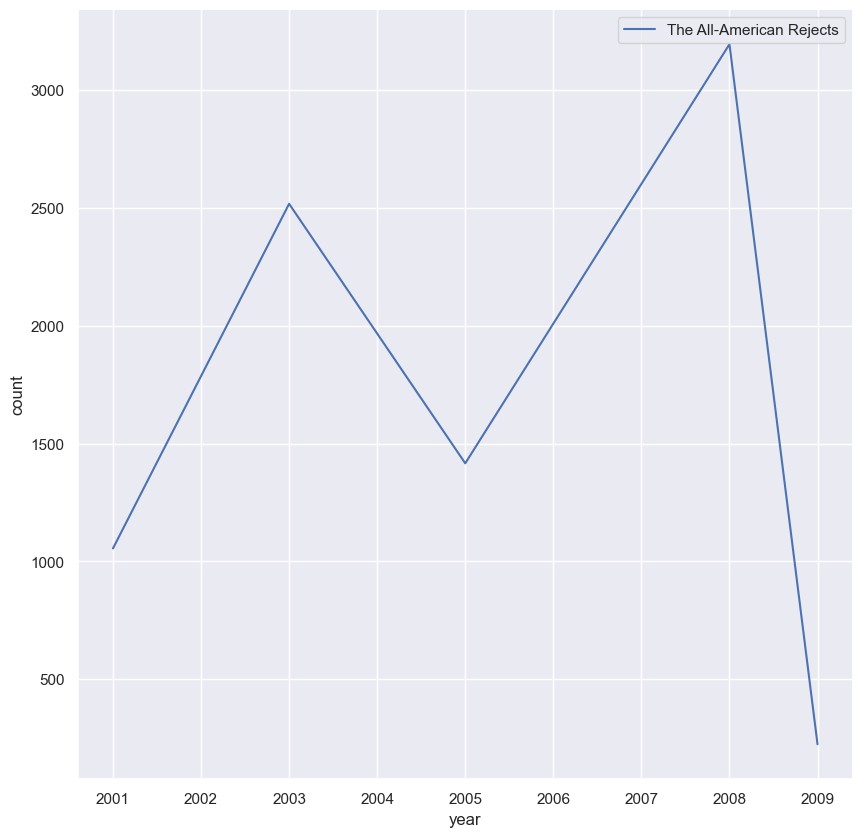

   year  count    artist_name
0  2003   2325  Amy Winehouse
1  2004    156  Amy Winehouse
2  2006   4780  Amy Winehouse
3  2007   1387  Amy Winehouse


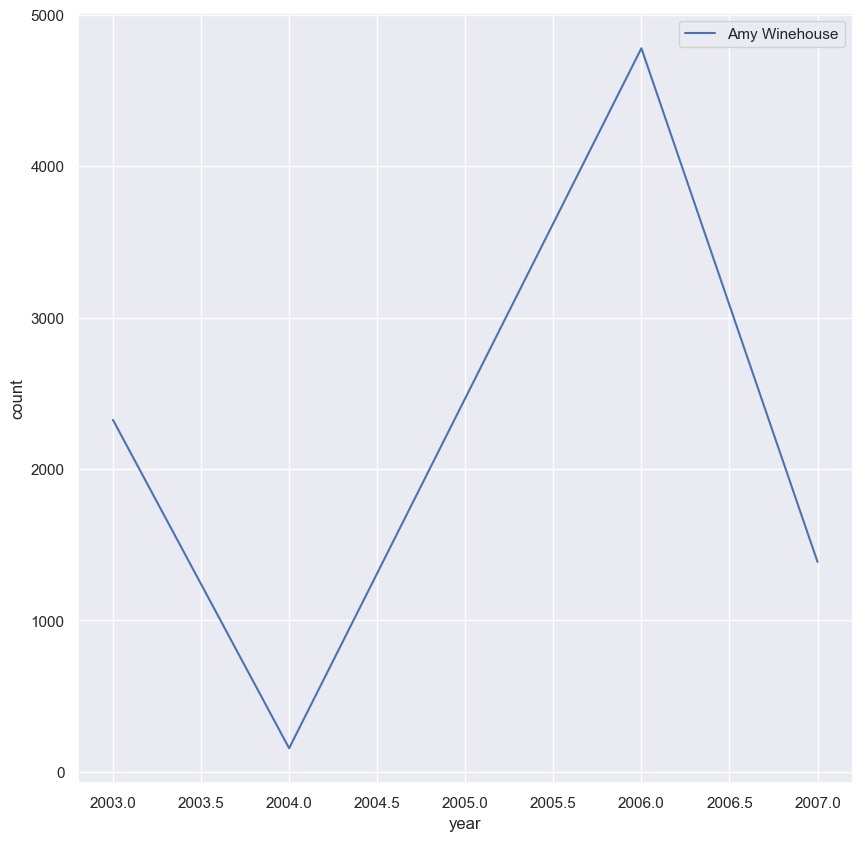

   year  count   artist_name
1  1989     83  Beastie Boys
2  1992   1408  Beastie Boys
3  1994    521  Beastie Boys
4  1998    697  Beastie Boys
5  2004     97  Beastie Boys


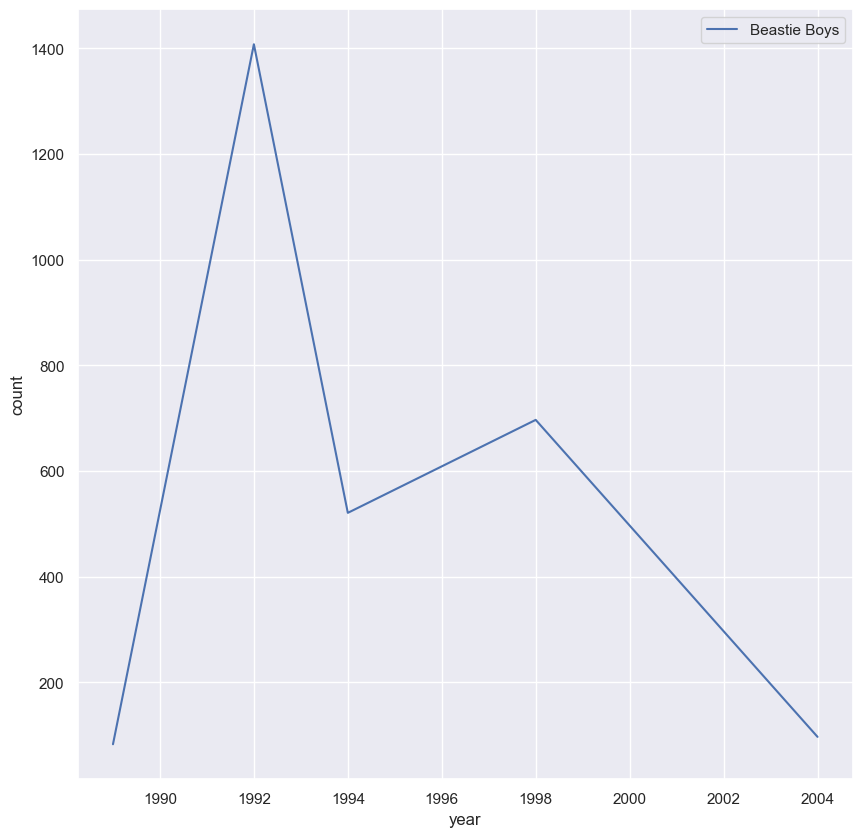

   year  count artist_name
0  2003   1272  Kanye West
1  2004    534  Kanye West
2  2005   1005  Kanye West
3  2007   2761  Kanye West
4  2008   1611  Kanye West


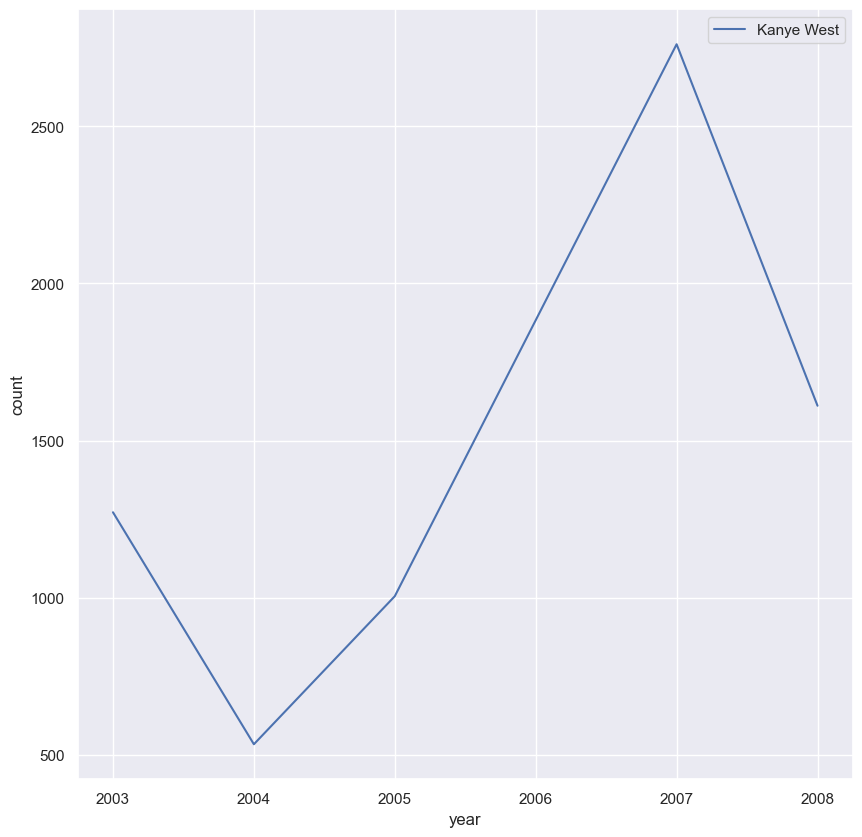

   year  count artist_name
1  2006   2615  Lily Allen
2  2007   1053  Lily Allen
3  2008    653  Lily Allen
4  2009   2967  Lily Allen


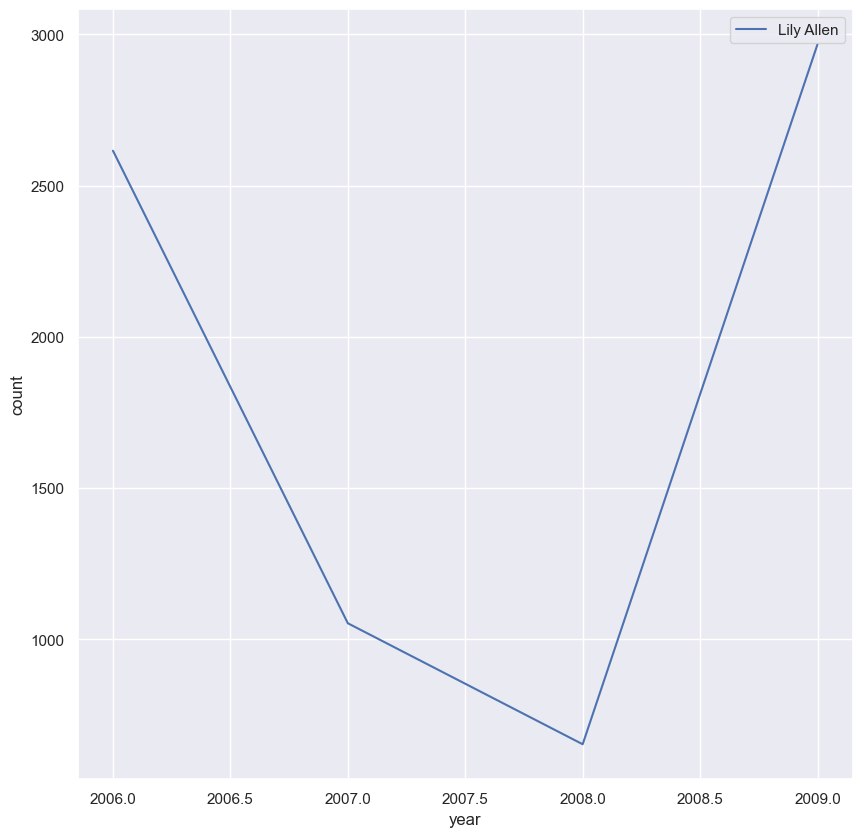

   year  count artist_name
1  2005   1199      Beirut
2  2006   1704      Beirut
3  2007   3956      Beirut
4  2009   1052      Beirut


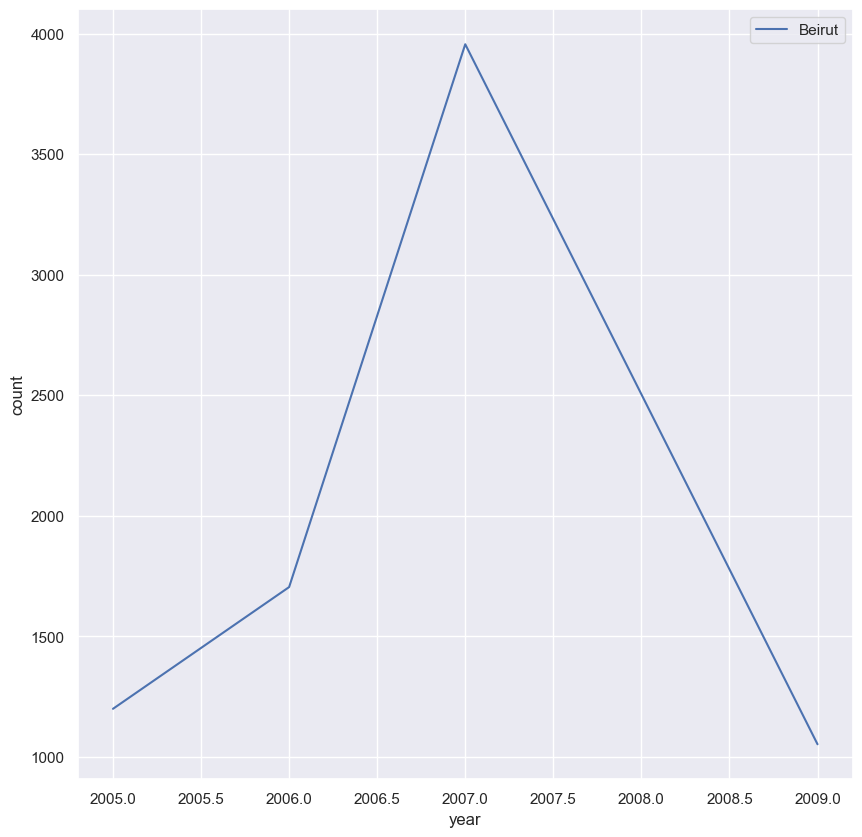

In [37]:
#Yearwise Popularity gain/loss of the most popular artist 
for artist in artist_df_name:
    
    art =data[data["artist_name"]==artist]

    art = art.groupby("year")["listen_count"].count().to_frame("count").reset_index().sort_values(by="year",ascending=True)
    index_names = art[ art['year'] == 0 ].index
    art=art.drop(index_names)
    art["artist_name"]=artist
    print(art)
    plt.figure(figsize=(10,10))
    if len(art)>2:
        sns.lineplot(x='year',y='count',data=art,label=artist)
        plt.show()
    else:
        
        sns.lineplot(x='year',y='count',data=art,label=artist)
        plt.show()

<Figure size 600x600 with 0 Axes>

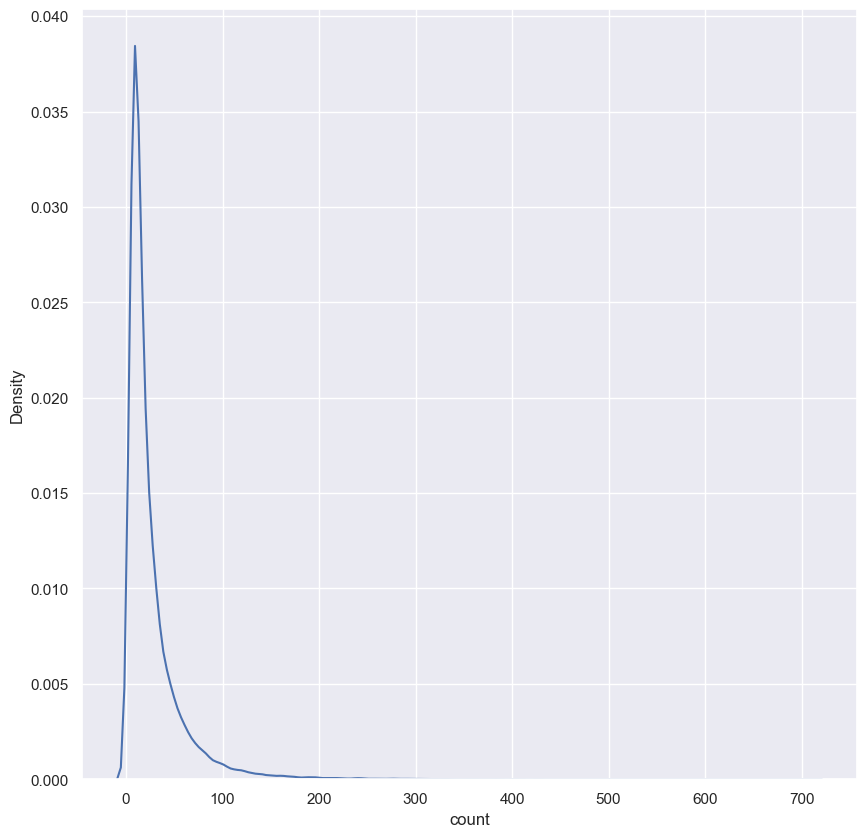

<Figure size 600x600 with 0 Axes>

In [48]:
numberofsongsexposed=data.groupby("user_id")["title"].count().to_frame("count").reset_index()
sns.kdeplot(x=numberofsongsexposed['count'])
plt.figure(figsize=(6,6))

In [90]:
numberofsongsexposed.describe()
# it is positively skewed which means there are less number of users who are exposed to lot of songs but there are few people
# are exposed to lot of songs

,count
count,76353.000000
mean,26.194125
std,31.625078
min,1.000000
25%,9.000000
50%,16.000000
75%,31.000000
max,711.000000


In [92]:
data.head()

,user_id,song_id,listen_count,title,release,artist_name,year
0,b80344d063b5ccb3212f76538f3d9e43d87dca9e,SOAKIMP12A8C130995,1,The Cove,Thicker Than Water,Jack Johnson,0
1,7c86176941718984fed11b7c0674ff04c029b480,SOAKIMP12A8C130995,1,The Cove,Thicker Than Water,Jack Johnson,0
2,76235885b32c4e8c82760c340dc54f9b608d7d7e,SOAKIMP12A8C130995,3,The Cove,Thicker Than Water,Jack Johnson,0
3,250c0fa2a77bc6695046e7c47882ecd85c42d748,SOAKIMP12A8C130995,1,The Cove,Thicker Than Water,Jack Johnson,0
4,3f73f44560e822344b0fb7c6b463869743eb9860,SOAKIMP12A8C130995,6,The Cove,Thicker Than Water,Jack Johnson,0


In [93]:
def create_popularity_recommendation(data1, user_id, item_id, n=10):

    data_grouped = data1.groupby([item_id]).agg({user_id: 'count'}).reset_index()
    data_grouped.rename(columns = {user_id: 'score'},inplace=True)
    
    #Sort the songs based upon recommendation score
    train_data_sort =data_grouped.sort_values('score',ascending=False)    
    #Generate a recommendation rank based upon score
    train_data_sort['Rank'] = train_data_sort.score.rank(ascending=0, method='first')
        
    #Get the top n recommendations
    popularity_recommendations = train_data_sort.head(n)
    return popularity_recommendations

In [94]:
recommendations = create_popularity_recommendation(data,'user_id','title', 15)

In [95]:
display(recommendations)

,title,score,Rank
6836,Sehr kosmisch,8277,1.0
8725,Undo,7032,2.0
1964,Dog Days Are Over (Radio Edit),6949,3.0
9496,You're The One,6729,4.0
6498,Revelry,6145,5.0
6825,Secrets,5841,6.0
3437,Horn Concerto No. 4 in E flat K495: II. Romanc...,5385,7.0
2595,Fireflies,4795,8.0
3322,Hey_ Soul Sister,4758,9.0
8495,Tive Sim,4548,10.0


In [96]:
recommendations = create_popularity_recommendation(data,'user_id','artist_name', 15)
display(recommendations)

,artist_name,score,Rank
649,Coldplay,29422,1.0
2850,The Black Keys,19862,2.0
1651,Kings Of Leon,18747,3.0
1107,Florence + The Machine,18112,4.0
1370,Jack Johnson,17801,5.0
2946,The Killers,16063,6.0
2374,Radiohead,14890,7.0
736,Daft Punk,14715,8.0
2073,Muse,14005,9.0
1554,Justin Bieber,13959,10.0


In [100]:
top_5000_songs['listen_count'].sum()/songs

0.8188004240376203

In [304]:
uniquesongsofuser=data[data["user_id"]=="c6db07e21f143f2287aa0f7c9697ca7fff36c0d6"]["song_id"].unique()
uniquesongsofuser

array(['SOFRQTD12A81C233C0', 'SOLRGVL12A8C143BC3', 'SOANQFY12AB0183239',
       'SODASIJ12A6D4F5D89', 'SOWFJLX12AB0183EE2', 'SOUOEMP12A8C13866E',
       'SOIZLKI12A6D4F7B61', 'SONHVVE12AB018D038', 'SOOWVNN12A8C140775',
       'SOXAQJS12AB018CBF7', 'SOXLOQG12AF72A2D55', 'SOFLJQZ12A6D4FADA6',
       'SOFNWPK12A6310F131', 'SOQCGHN12AB0181246', 'SOUBKMI12AB0188B43',
       'SOWWYBK12A8C145607', 'SOLRBSH12AB018AE7B', 'SOCGVMO12A67AE24CC',
       'SOHQNBP12AC468B2BC', 'SOPVDJB12AC468B28B', 'SOVITPC12AC468A1B7',
       'SOBOUPA12A6D4F81F1', 'SOFCPOU12A8C13BF40', 'SOMKHKP12A6D4F8BA7',
       'SOSYOHI12A8C144584', 'SOKKUJN12A63110824', 'SOUEAAS12A8C133106',
       'SOJIJWG12AAF3B46C0', 'SOGHOJB12A6D4FA7DC', 'SOWRREB12A6D4FA7CB',
       'SOCGOZK12A8151BD5D', 'SOFTWWH12AB017AD0E', 'SOIEBXT12A8C1341E1',
       'SOXZUAV12A6310F21A', 'SOMFUWK12A6D4F8AFA', 'SOQXGWV12AF72A0BE9',
       'SOTXTXV12A58A7CAD5', 'SOGJFUU12A8AE47D26', 'SOXKOIY12A8C13C1EA',
       'SOXHYVQ12AB0187949', 'SOATSLL12AB017B862', 

In [302]:
 len(uniquesongsr)

10000

In [311]:
def ItemSimilarityBasedRecommendationEngine(user_id):
    import numpy as np
    uniquesongsofuser=data[data["user_id"]==user_id]["song_id"].unique()
    
    
    uniquesongall=data["song_id"].unique()
    
    m = np.empty((len(uniquesongsofuser),len(uniquesongall)))
    print(m)
    user_song_unique_user_no=[]
    user_song_unique_user=[]

    for song_id in  uniquesongsofuser:
         dict={}
         k=data[data["song_id"]==song_id]
         count=[ i for i in k["user_id"].unique()]
         dict[song_id]=count
         user_song_unique_user.append(dict)
     
         user_song_unique_user_no.append(len(count))
    user_song_unique_all_no=[]
    user_song_unique_all=[]

    time=1
    for song_id in uniquesongall:
         dict={}
         k=data[data["song_id"]==song_id]
         count=[ i for i in k["user_id"].unique()]
         dict[song_id]=count
         user_song_unique_all.append(dict)
         print(time)
         time=time+1
    
     
         user_song_unique_all_no.append(len(count))
    print(m)
    row=0
    column=0
    for i in user_song_unique_user :
        print(row)
        for key,value in i.items():
            user1=value
            song1=key
            for j in user_song_unique_all:
                print(column)
                for key2,value2 in j.items():
                    user2=value2
                    song2=key2
                    if(song1!=song2):
                        m[row,column]=len(np.intersect1d(user1, user2, assume_unique=True))/len(np.union1d(user1,user2))
                    column=column+1
               
        column=0
        row=row+1
    print("total user songs:%d"%len(user_song_unique_user))  
    print("total songs in the training set:%d"%len(user_song_unique_all))
    print("Non zero values in cooccurence_matrix :%d" % np.count_nonzero(m))
    k=(m.sum(axis=0)/len(m)).tolist()
    res = sorted(range(len(k)), key = lambda sub: k[sub])
    res.reverse()
    rec=res[:10] 
    alll= uniquesongall.tolist()
    recomm= [alll[index] for index in rec]
    song = pd.read_csv("song_data.csv")
    print("details of songs user listens to")
    list=[]
    print("-----------------------------------------------------------")
    for j in  uniquesongsofuser:
       
        print(song[song['song_id']==j][['title','release','artist_name']])
        list.append(song[song['song_id']==j][['title']])
    print("___________________________________________________________")
    rlist=[]
    print("recommendations *******")
    for j in recomm:
    
        print(song[song['song_id']==j][['title','release','artist_name']])
    rlist.append(song[song['song_id']==j][['title']])
    print("*****************************************************************")
    
    

In [312]:


ItemSimilarityBasedRecommendationEngine("c6db07e21f143f2287aa0f7c9697ca7fff36c0d6")

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238


In [52]:
us=data[data["user_id"]=="c6db07e21f143f2287aa0f7c9697ca7fff36c0d6"]


In [55]:
us

,user_id,song_id,listen_count,title,release,artist_name,year
9685,c6db07e21f143f2287aa0f7c9697ca7fff36c0d6,SOFRQTD12A81C233C0,1,Sehr kosmisch,Musik von Harmonia,Harmonia,0
135431,c6db07e21f143f2287aa0f7c9697ca7fff36c0d6,SOLRGVL12A8C143BC3,7,Bulletproof,Bulletproof,La Roux,2009
194573,c6db07e21f143f2287aa0f7c9697ca7fff36c0d6,SOANQFY12AB0183239,7,Uprising,Uprising,Muse,0
199543,c6db07e21f143f2287aa0f7c9697ca7fff36c0d6,SODASIJ12A6D4F5D89,1,The Invisible Man,The Invisible Man,Michael Cretu,1985
365622,c6db07e21f143f2287aa0f7c9697ca7fff36c0d6,SOWFJLX12AB0183EE2,1,Under The Sheets,Under The Sheets,Ellie Goulding,2009
...,...,...,...,...,...,...,...
1854569,c6db07e21f143f2287aa0f7c9697ca7fff36c0d6,SOWWPGF12A6D4F841F,14,Ooh La La,Celebrate Gay Pride,Goldfrapp,2005
1855175,c6db07e21f143f2287aa0f7c9697ca7fff36c0d6,SOGOFNM12A8AE460BF,1,Every Little Thing (Album Version),The Platinum Collection,Carlene Carter,0
1873445,c6db07e21f143f2287aa0f7c9697ca7fff36c0d6,SONLUQI12A6D4FABFA,1,Mudanca De Tempo,Mudanca De Tempo,O Terco,0
1877398,c6db07e21f143f2287aa0f7c9697ca7fff36c0d6,SOJHQCA128CB806336,1,Ho Ho Hopefully,... And A Happy New Year,The Maine,0


                                          artist_name  count
39                                               Muse     38
30                                          Ladyhawke     22
8                                          Bloc Party     17
24                                          Goldfrapp     17
3                                      Arctic Monkeys     15
19                                    Ella Fitzgerald     14
49                                          The Kooks     13
25                                           Gorillaz     12
33                                             M.I.A.     11
23                                    Franz Ferdinand     10
43                                       Norman Blake     10
28                         Kleerup featuring Lykke Li     10
31                                         Lily Allen     10
45  Peter_ Bjorn and John Featuring Victoria Bergsman      9
40                                           N.E.R.D.      9
48                      

<AxesSubplot:xlabel='count', ylabel='artist_name'>

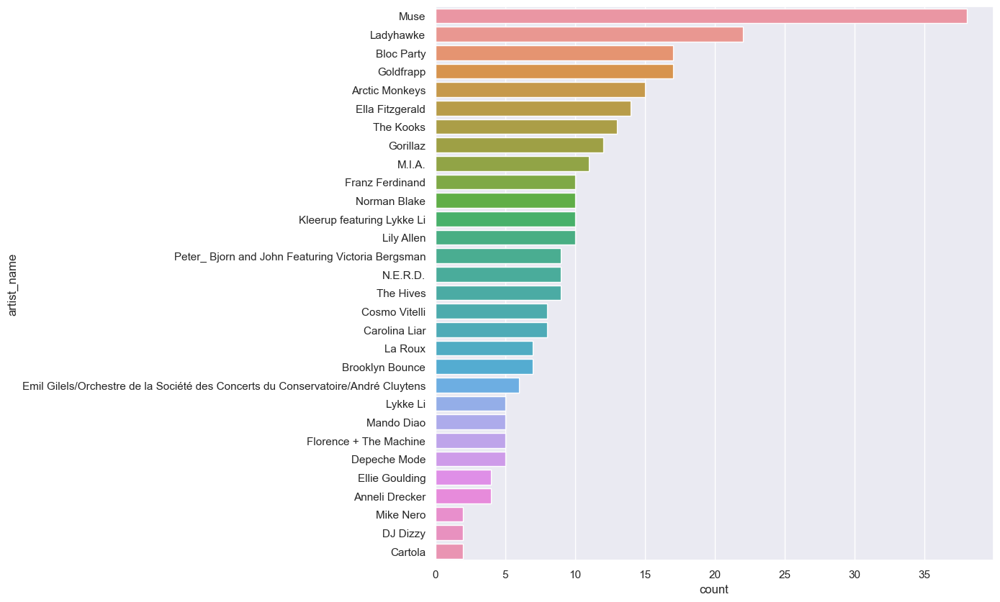

In [54]:
album=us.groupby("artist_name")['listen_count'].sum().to_frame('count').reset_index()
album = album.sort_values(by="count",ascending=False).head(30)
print(album)
sns.barplot(x="count",y="artist_name",data=album)

total user songs:33
total songs in the training set:5000
Non zero values in cooccurence_matrix :121985


details of songs user listens to
-----------------------------------------------------------
           title             release   artist_name
397229  The Cove  Thicker Than Water  Jack Johnson
___________________________________________________________
-----------------------------------------------------------
                title              release    artist_name
4822  Entre Dos Aguas  Flamenco Para Niños  Paco De Lucia
___________________________________________________________
-----------------------------------------------------------
           title     release artist_name
133174  Stronger  Graduation  Kanye West
594489  Stronger  Graduation  Kanye West
___________________________________________________________
-----------------------------------------------------------
                 title            release   artist_name
971391  Constellations  In Between Dreams  Jack Johnson
___________________________________________________________
----------------------------------

recommendations *******
--------------------------------------------
               title      release  artist_name
834983  Quiet Houses  Fleet Foxes  Fleet Foxes
--------------------------------------------
              title      release  artist_name
939863  Meadowlarks  Fleet Foxes  Fleet Foxes
--------------------------------------------
                      title      release  artist_name
955922  Heard Them Stirring  Fleet Foxes  Fleet Foxes
--------------------------------------------
                              title      release  artist_name
102372  Tiger Mountain Peasant Song  Fleet Foxes  Fleet Foxes
--------------------------------------------
               title      release  artist_name
333174  Sun It Rises  Fleet Foxes  Fleet Foxes
--------------------------------------------
                 title      release  artist_name
777445  Your Protector  Fleet Foxes  Fleet Foxes
--------------------------------------------
               title      release  artist_name
6504

In [235]:
d
    

count    2.000000e+06
mean     3.045485e+00
std      6.579720e+00
min      1.000000e+00
25%      1.000000e+00
50%      1.000000e+00
75%      3.000000e+00
max      2.213000e+03
Name: listen_count, dtype: float64

array(['Thicker Than Water', 'In Between Dreams', 'On And On',
       'Brushfire Fairytales', 'On and On', 'You And Your Heart',
       'Sleep Through The Static',
       'Sing-A-Longs & Lullabies For The Film Curious George',
       'Sleep Through The Static: Remixed', 'En Concert', 'Wasting Time'],
      dtype=object)

In [157]:

svddata=data.sample(frac=0.05)
svddata

,user_id,song_id,listen_count,title,release,artist_name,year
529680,9675f611872bcf410e5f0f955ad72de7ead027bc,SOOWVNN12A8C140775,1,Rabbit Heart (Raise It Up),Rabbit Heart EP,Florence + The Machine,2009
1086071,e305dd2d438370b4332523885f64d0ba0369672d,SOLZYWQ12A8C13F269,3,Scatman (Ski-Ba-Bop-Ba-Dop-Bop),The Pop Years 1994 - 1995,Scatman John,1995
803016,422b12d6f6a460f5723c51ac5d5d323d9a22ea92,SOJSQYL12A81C23901,7,Xehasmeni Melodia,14 Megala Tragoudia - Onar,Onar,0
1612586,b5f603d8d8d67867b7b447f50450980de2064bdf,SOEWPFY12AF729F7FC,1,Say What You Say,The Eminem Show,Eminem / Dr. Dre,2002
1212411,0c7c8c0304f84146abc99ae4729b71bfb570269f,SOCIGMX12A8C144150,1,My Night With the Prostitute From Marseille,March of the Zapotec and Realpeople Holland,Beirut,2007
...,...,...,...,...,...,...,...
1155436,e5e1107628e1eb6548b8820d8b101d7b3e37182b,SOZLEXV12AB018A526,1,Untitled (Figures),FatCat Sampler 2009,Max Richter,2002
746872,d24ab5d173dbd8120a2d768402abb9b75f285c34,SOASTSF12A8C1420B5,1,Welk,Dolores,Bohren & Der Club Of Gore,2008
1668691,d204b964de1b8d8e14c2810acff478f6df12c1fd,SOHBJSM12AB0185298,1,Long May You Run,Sounds of Vancouver 2010: Closing Ceremony Com...,Neil Young,1992
1253328,4ae8c867c2aded35f6d4def45a56280ea08a1985,SOTJDDY12AB017DC5B,2,I'm In Miami Bitch,Party Rock,LMFAO,2008


In [158]:

total= data[['user_id','listen_count']].groupby('user_id').sum().reset_index()
total.rename(columns={'listen_count':'total_listen_count'})
merged = pd.merge(svddata,total,on='user_id',how="inner")


In [159]:
merged

,user_id,song_id,listen_count_x,title,release,artist_name,year,listen_count_y
0,9675f611872bcf410e5f0f955ad72de7ead027bc,SOOWVNN12A8C140775,1,Rabbit Heart (Raise It Up),Rabbit Heart EP,Florence + The Machine,2009,186
1,9675f611872bcf410e5f0f955ad72de7ead027bc,SOFRQTD12A81C233C0,1,Sehr kosmisch,Musik von Harmonia,Harmonia,0,186
2,9675f611872bcf410e5f0f955ad72de7ead027bc,SOSACAB12AB01876E4,2,From The Station,Hell Train,Soltero,0,186
3,9675f611872bcf410e5f0f955ad72de7ead027bc,SOWOMMY127F8096DF9,2,Time To Pretend,Time To Pretend,MGMT,2005,186
4,9675f611872bcf410e5f0f955ad72de7ead027bc,SOTKFFF12AC9072C86,1,I Need All The Friends I Can Get,Let's Get Out Of This Country,Camera Obscura,0,186
...,...,...,...,...,...,...,...,...
99995,6323261e8740fda49b116736c9792aa4a35567ea,SOIBYJC12AB017C771,8,Harold T. Wilkins_ or How to Wait for a Very L...,Reservoir,Fanfarlo,2009,90
99996,7f7017ded64749adc5b5b606f794719306113747,SOONJMQ12A8C137E6D,1,The Whole World,Big Boi & Dre Present_ Outkast,Outkast Featuring Killer Mike,0,16
99997,63b0fc121194b8205b4955c26b10f74f65505b68,SOTNHIP12AB0183131,25,Make Her Say,Make Her Say,Kid Cudi / Kanye West / Common,2009,61
99998,d204b964de1b8d8e14c2810acff478f6df12c1fd,SOHBJSM12AB0185298,1,Long May You Run,Sounds of Vancouver 2010: Closing Ceremony Com...,Neil Young,1992,26


In [160]:
merged.rename(columns={'listen_count_y':'total_listen_count'},inplace=True)
merged['fractional_play_count'] = merged['listen_count_x']/merged['total_listen_count']

In [161]:
merged

,user_id,song_id,listen_count_x,title,release,artist_name,year,total_listen_count,fractional_play_count
0,9675f611872bcf410e5f0f955ad72de7ead027bc,SOOWVNN12A8C140775,1,Rabbit Heart (Raise It Up),Rabbit Heart EP,Florence + The Machine,2009,186,0.005376
1,9675f611872bcf410e5f0f955ad72de7ead027bc,SOFRQTD12A81C233C0,1,Sehr kosmisch,Musik von Harmonia,Harmonia,0,186,0.005376
2,9675f611872bcf410e5f0f955ad72de7ead027bc,SOSACAB12AB01876E4,2,From The Station,Hell Train,Soltero,0,186,0.010753
3,9675f611872bcf410e5f0f955ad72de7ead027bc,SOWOMMY127F8096DF9,2,Time To Pretend,Time To Pretend,MGMT,2005,186,0.010753
4,9675f611872bcf410e5f0f955ad72de7ead027bc,SOTKFFF12AC9072C86,1,I Need All The Friends I Can Get,Let's Get Out Of This Country,Camera Obscura,0,186,0.005376
...,...,...,...,...,...,...,...,...,...
99995,6323261e8740fda49b116736c9792aa4a35567ea,SOIBYJC12AB017C771,8,Harold T. Wilkins_ or How to Wait for a Very L...,Reservoir,Fanfarlo,2009,90,0.088889
99996,7f7017ded64749adc5b5b606f794719306113747,SOONJMQ12A8C137E6D,1,The Whole World,Big Boi & Dre Present_ Outkast,Outkast Featuring Killer Mike,0,16,0.062500
99997,63b0fc121194b8205b4955c26b10f74f65505b68,SOTNHIP12AB0183131,25,Make Her Say,Make Her Say,Kid Cudi / Kanye West / Common,2009,61,0.409836
99998,d204b964de1b8d8e14c2810acff478f6df12c1fd,SOHBJSM12AB0185298,1,Long May You Run,Sounds of Vancouver 2010: Closing Ceremony Com...,Neil Young,1992,26,0.038462


In [162]:
user_codes = merged["user_id"].drop_duplicates().reset_index()
user_codes.rename(columns={'index':'row'}, inplace=True)
lst=[]
for i in user_codes.index:
        lst.append(i)
user_codes['us_index_value'] = lst

In [163]:
user_codes

,row,user_id,us_index_value
0,0,9675f611872bcf410e5f0f955ad72de7ead027bc,0
1,5,e305dd2d438370b4332523885f64d0ba0369672d,1
2,14,422b12d6f6a460f5723c51ac5d5d323d9a22ea92,2
3,15,b5f603d8d8d67867b7b447f50450980de2064bdf,3
4,19,0c7c8c0304f84146abc99ae4729b71bfb570269f,4
...,...,...,...
43898,99995,6323261e8740fda49b116736c9792aa4a35567ea,43898
43899,99996,7f7017ded64749adc5b5b606f794719306113747,43899
43900,99997,63b0fc121194b8205b4955c26b10f74f65505b68,43900
43901,99998,d204b964de1b8d8e14c2810acff478f6df12c1fd,43901


In [164]:
song_codes = merged['song_id'].drop_duplicates().reset_index()
song_codes.rename(columns={'index':'song_index'}, inplace=True)
lst=[]
for i in song_codes.index:
        lst.append(i)
song_codes['song_index_value'] = lst

In [165]:
song_codes.index

RangeIndex(start=0, stop=9918, step=1)

In [166]:
dt = pd.merge(merged,song_codes,how='inner',on='song_id')
dt = pd.merge(dt,user_codes,how='inner',on='user_id')

In [167]:
dt

,user_id,song_id,listen_count_x,title,release,artist_name,year,total_listen_count,fractional_play_count,song_index,song_index_value,row,us_index_value
0,9675f611872bcf410e5f0f955ad72de7ead027bc,SOOWVNN12A8C140775,1,Rabbit Heart (Raise It Up),Rabbit Heart EP,Florence + The Machine,2009,186,0.005376,0,0,0,0
1,9675f611872bcf410e5f0f955ad72de7ead027bc,SOFRQTD12A81C233C0,1,Sehr kosmisch,Musik von Harmonia,Harmonia,0,186,0.005376,1,1,0,0
2,9675f611872bcf410e5f0f955ad72de7ead027bc,SOSACAB12AB01876E4,2,From The Station,Hell Train,Soltero,0,186,0.010753,2,2,0,0
3,9675f611872bcf410e5f0f955ad72de7ead027bc,SOWOMMY127F8096DF9,2,Time To Pretend,Time To Pretend,MGMT,2005,186,0.010753,3,3,0,0
4,9675f611872bcf410e5f0f955ad72de7ead027bc,SOTKFFF12AC9072C86,1,I Need All The Friends I Can Get,Let's Get Out Of This Country,Camera Obscura,0,186,0.005376,4,4,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,78a0dccc82da4676e63b35e38654bc0a6dcce6cf,SOZUFJQ12AF729E4D2,3,"A Little Less Sixteen Candles_ A Little More ""...",Believers Never Die - Greatest Hits,Fall Out Boy,2009,51,0.058824,99165,9914,99165,43086
99996,8a1f1778b23381e9ad6e43d09afdff9e0dc49132,SODWRNB12AB0183B3B,1,Entre Tus Alas,Dejarte De Amar,Camila,2010,149,0.006711,99299,9915,99299,43215
99997,dfdebba7d351955d09da47d68b5731d51ca7aa10,SODWRNB12AB0183B3B,1,Entre Tus Alas,Dejarte De Amar,Camila,2010,56,0.017857,99299,9915,99783,43687
99998,55f59f7b508437f0e644fc70faf5c9d667fd1cb7,SOSREUK12A6D4F82B6,7,Attention (Album Version),Almost Here,The Academy Is...,2005,22,0.318182,99569,9916,99569,43475


In [168]:
mat = dt[['row','song_index','fractional_play_count']]

data_array = mat.fractional_play_count.values
row_array = mat.row.values
col_array = mat.song_index.values

In [169]:
len(col_array)

100000

In [170]:
from scipy.sparse import coo_matrix
coo = coo_matrix((data_array, (row_array, col_array)))

In [171]:
coo.shape[0]

100000

In [172]:
import math as mt
import csv
from scipy.sparse.linalg import svds #used for matrix factorization
import numpy as np
from scipy.sparse import csc_matrix #used for sparse matrix
from scipy.sparse.linalg import * #used for matrix multiplication

In [173]:
MAX_PID = coo.shape[1]
MAX_UID = coo.shape[0]

In [174]:


def compute_svd(urm, K):
    U, s, Vt = svds(urm, K)

    dim = (len(s), len(s))
    S = np.zeros(dim, dtype=np.float32)
    for i in range(0, len(s)):
        S[i,i] = mt.sqrt(s[i])

    U = csc_matrix(U, dtype=np.float32)
    S = csc_matrix(S, dtype=np.float32)
    Vt = csc_matrix(Vt, dtype=np.float32)
    
    return U, S, Vt

def compute_estimated_matrix(urm, U, S, Vt, uTest, K, test):
    rightTerm = S*Vt 
    max_recommendation = 250
    estimatedRatings = np.zeros(shape=(MAX_UID, MAX_PID), dtype=np.float16)
    recomendRatings = np.zeros(shape=(MAX_UID,max_recommendation ), dtype=np.float16)
    for userTest in uTest:
        prod = U[userTest, :]*rightTerm
        estimatedRatings[userTest, :] = prod.todense()
        recomendRatings[userTest, :] = (-estimatedRatings[userTest, :]).argsort()[:max_recommendation]
    return recomendRatings

def show_recomendations(uTest, num_recomendations = 20):
    for user in uTest:
        print('-'*70)
        print(f"Recommendation for user id {user}")
        rank_value = 1
        i = 0
        while (rank_value <  num_recomendations + 1):
            so = uTest_recommended_items[user,i:i+1][0]
            if (dt.user_id[(dt.song_index_value == so) & (dt.us_index_value == user)].count()==0):
                song_details = dt[(dt.song_index_value == so)].\
                    drop_duplicates('song_index_value')[['title','artist_name']]
                print(f"The number{rank_value}  recommended song is {song_details['title']} BY {song_details['artist_name']}") 
                                                                 
                                                                      
                rank_value= rank_value+1
            i =i+ 1

In [175]:
K=50
urm = coo


U, S, Vt = compute_svd(urm, K)
uTest = [4,5,6,7,8,873,9685]

uTest_recommended_items = compute_estimated_matrix(urm, U, S, Vt, uTest, K, True)

show_recomendations(uTest)

----------------------------------------------------------------------
Recommendation for user id 4
The number1  recommended song is 0    Rabbit Heart (Raise It Up)
Name: title, dtype: object BY 0    Florence + The Machine
Name: artist_name, dtype: object
The number2  recommended song is Series([], Name: title, dtype: object) BY Series([], Name: artist_name, dtype: object)
The number3  recommended song is Series([], Name: title, dtype: object) BY Series([], Name: artist_name, dtype: object)
The number4  recommended song is Series([], Name: title, dtype: object) BY Series([], Name: artist_name, dtype: object)
The number5  recommended song is Series([], Name: title, dtype: object) BY Series([], Name: artist_name, dtype: object)
The number6  recommended song is Series([], Name: title, dtype: object) BY Series([], Name: artist_name, dtype: object)
The number7  recommended song is Series([], Name: title, dtype: object) BY Series([], Name: artist_name, dtype: object)
The number8  recommended

In [176]:
svddata[svddata["user_id"]=="146963e06bdd43d870f78a963c2778a2b39b7a9a"]

,user_id,song_id,listen_count,title,release,artist_name,year
138557,146963e06bdd43d870f78a963c2778a2b39b7a9a,SOALEQA12A58A77839,6,Jumping Jack Flash,Shine A Light,The Rolling Stones,1982
1537140,146963e06bdd43d870f78a963c2778a2b39b7a9a,SOSYHME12A8C135DD8,1,Du Hast,Family Values Tour '98,Rammstein,1997
1957939,146963e06bdd43d870f78a963c2778a2b39b7a9a,SOWSZBE12AB01830DE,1,The Legionnaire's Lament,Castaways and Cutouts,The Decemberists,2002
1786496,146963e06bdd43d870f78a963c2778a2b39b7a9a,SOIDJZY12A6701DEF7,3,Voodoo Chile Blues,Blues,Jimi Hendrix,1994
